# ROI Analysis Runner

This notebook runs the generalized ROI analysis functions with chin support:

- Single video (DATASET_1/10-gt/vid.avi):
  - POS vs GREEN by ROI with HRs
  - All-ROIs plots with peaks and cross-correlation
  - Sliding cross-correlation (unfiltered and filtered)
- UBFC dataset-wide analysis (here limited to DATASET_1), saving CSV results




In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from roi_analysis import (
    analyze_video_pos_green_with_plots,
    plot_all_rois_signals_and_xcorr,
    plot_rois_xcorr_from_video,
    sliding_xcorr_lag_from_video,
    analyze_ubfc_lag_metrics_with_hr_filter,
    analyze_lossless_videos_lag_metrics,
    analyze_lossless_videos_lag_metrics_discrete,
)

%matplotlib inline



In [8]:
# Parameters and paths
fs = 30
window_length = 60
start_time = 5

base_folder = 'UBFC_DATASET_MERGED'
dataset_name = 'DATASET_1'
subject_dir = '10-gt'  # single video to analyze
single_video_path = os.path.join(base_folder, dataset_name, subject_dir, 'vid.avi')

print('Single video path:', single_video_path)



Single video path: UBFC_DATASET_MERGED\DATASET_1\10-gt\vid.avi


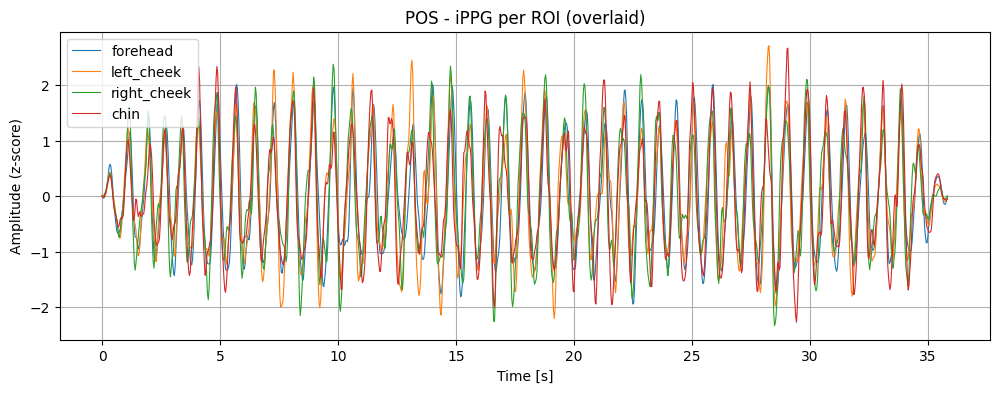

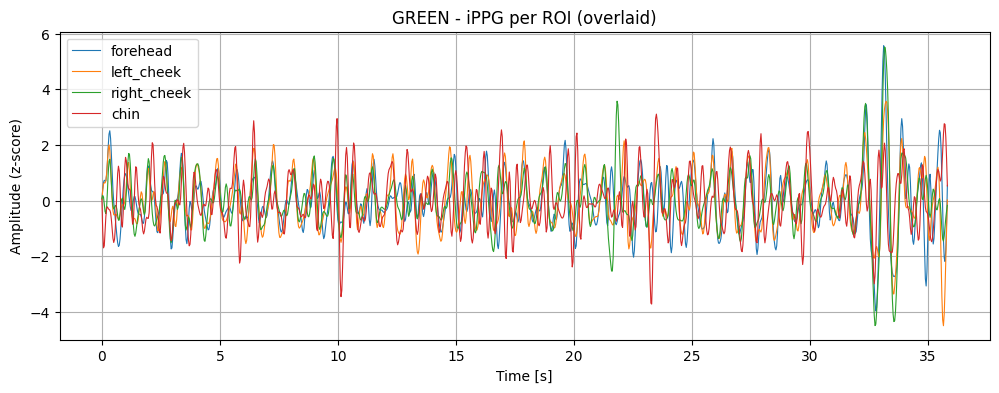

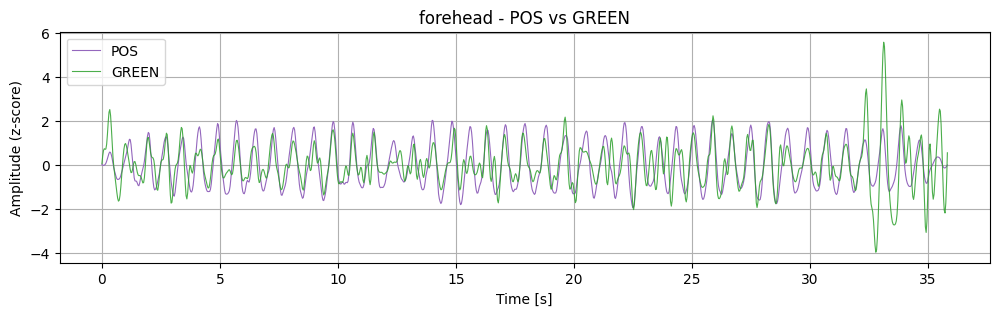

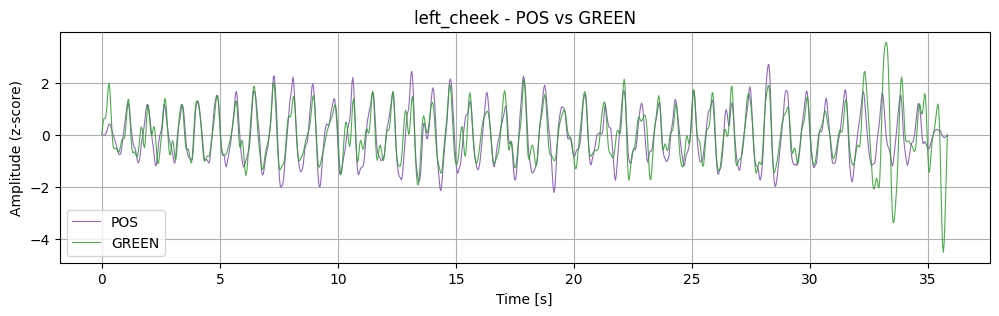

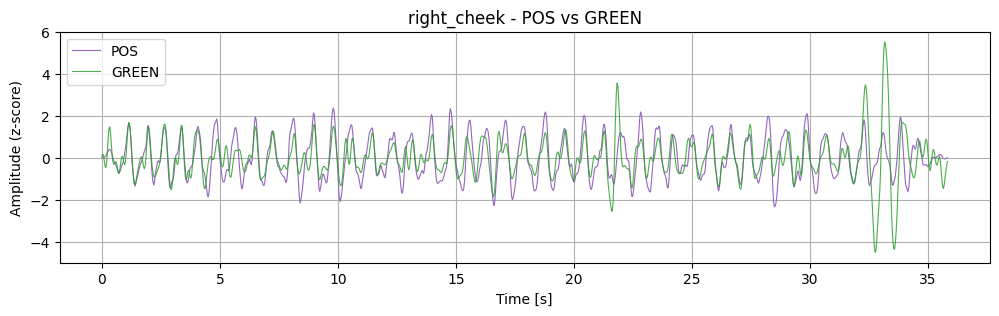

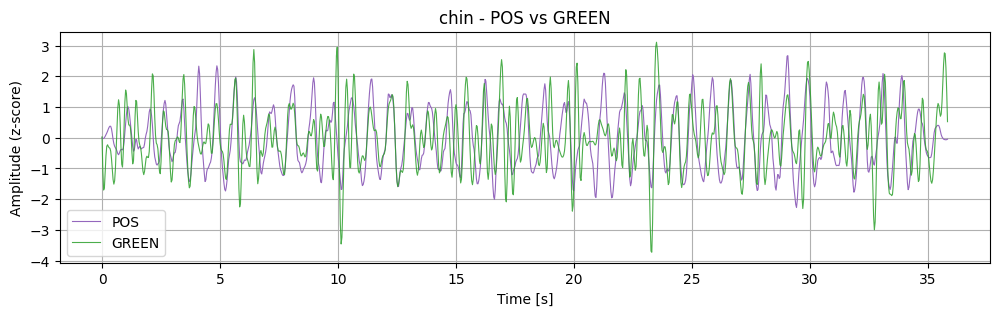

HR POS (bpm) by ROI:
  chin        : 77.34
  forehead    : 77.34
  left_cheek  : 77.34
  right_cheek : 77.34
HR GREEN (bpm) by ROI:
  chin        : 77.34
  forehead    : 77.34
  left_cheek  : 77.34
  right_cheek : 77.34


In [3]:
# Single video: POS and GREEN analysis per ROI (includes chin)
pos_signals, green_signals, hr_pos, hr_green = analyze_video_pos_green_with_plots(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
)

print('HR POS (bpm) by ROI:')
for k, v in sorted(hr_pos.items()):
    print(f'  {k:12s}: {v:.2f}')

print('HR GREEN (bpm) by ROI:')
for k, v in sorted(hr_green.items()):
    print(f'  {k:12s}: {v:.2f}')



## 10-GT SIN INTERPOLACION

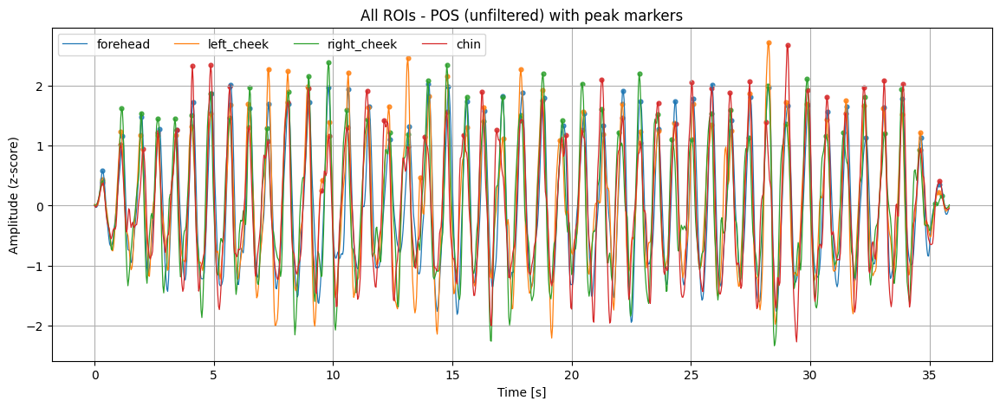

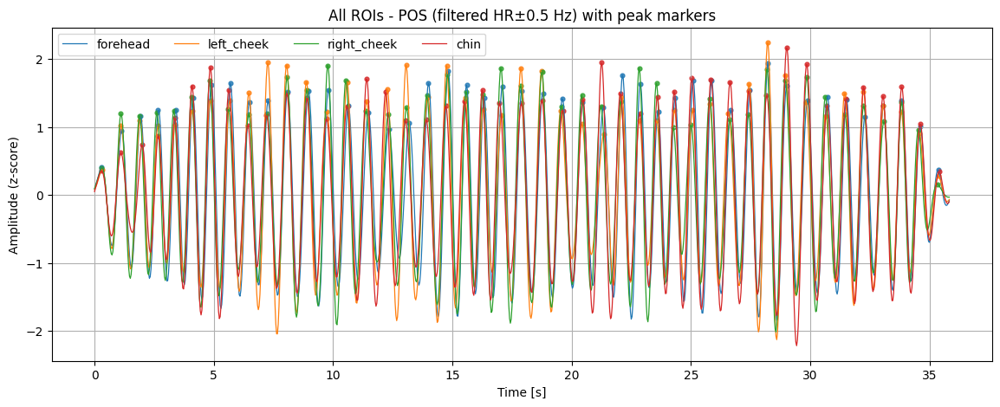

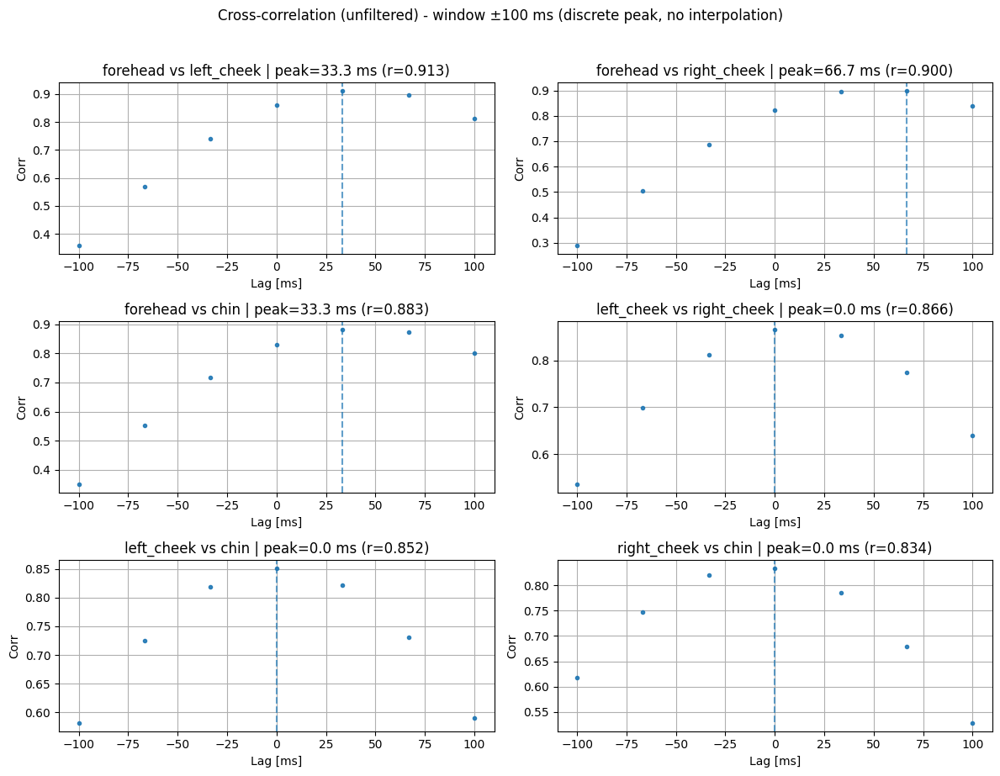

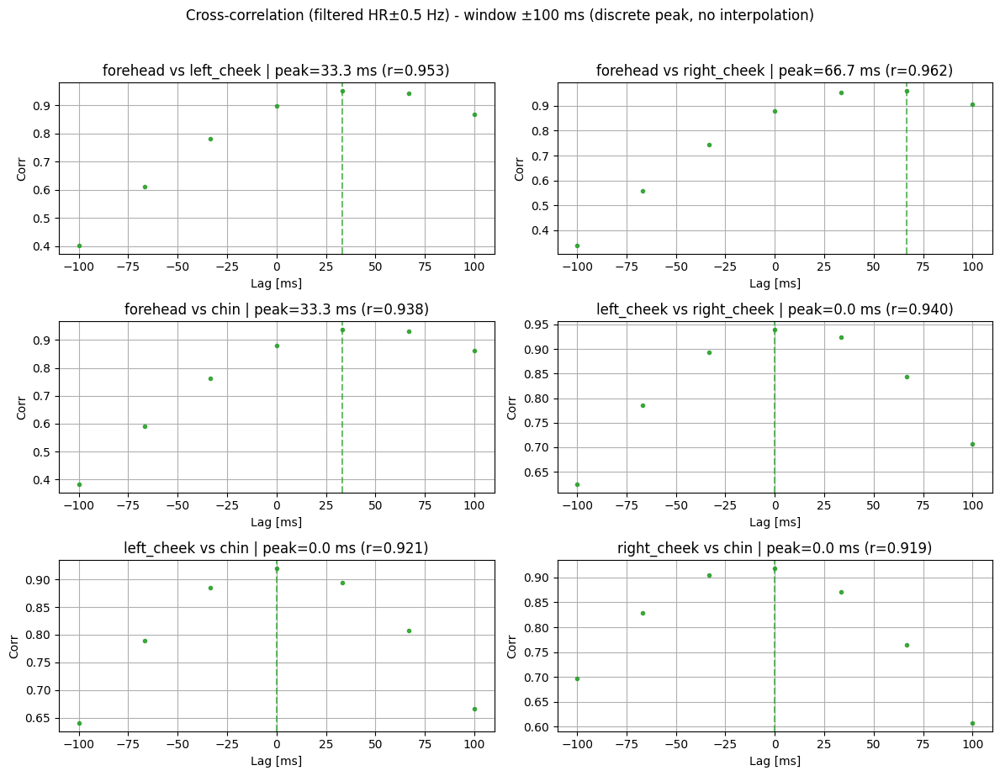

In [3]:
# Single video: All ROIs plots with peaks and cross-correlation (includes chin)
_ = plot_rois_xcorr_from_video(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    show_filtered=True, normalize=True,
    subsample_peak=False
)



## 10 GT CON INTERPOLACION

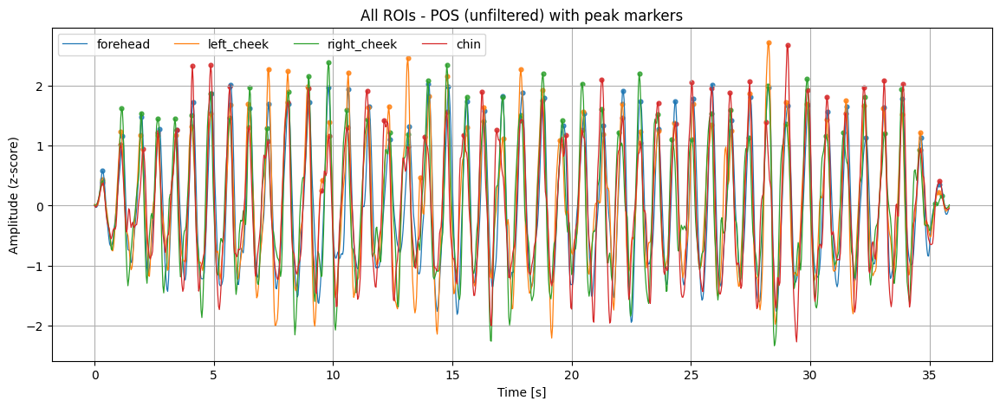

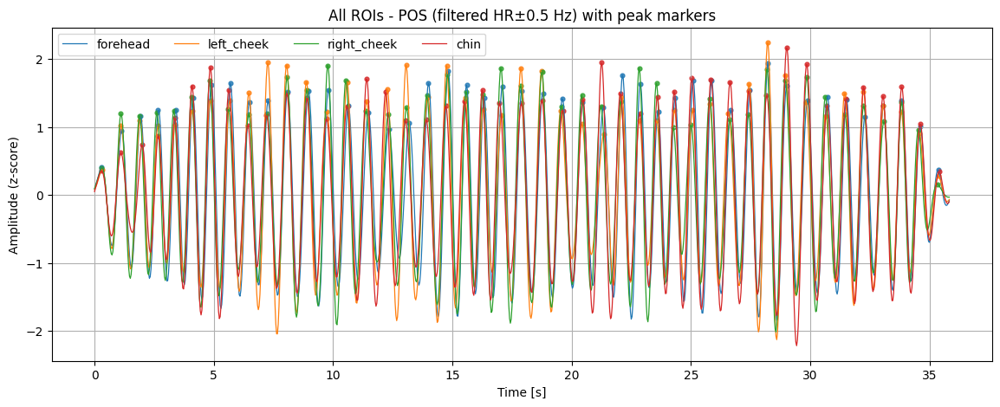

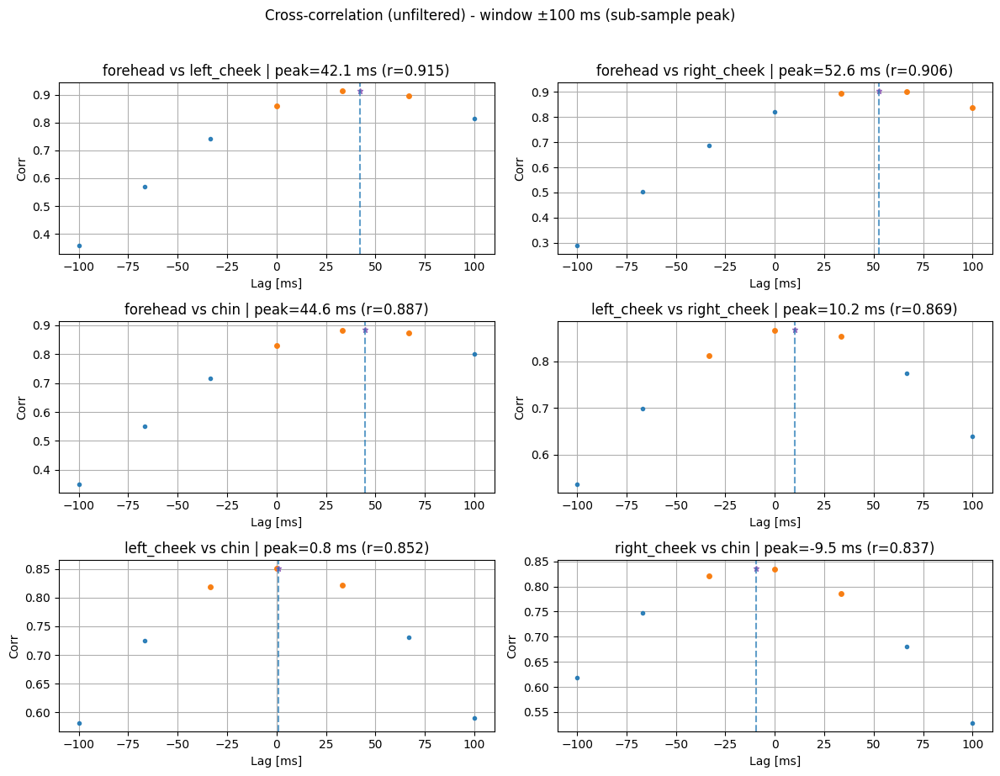

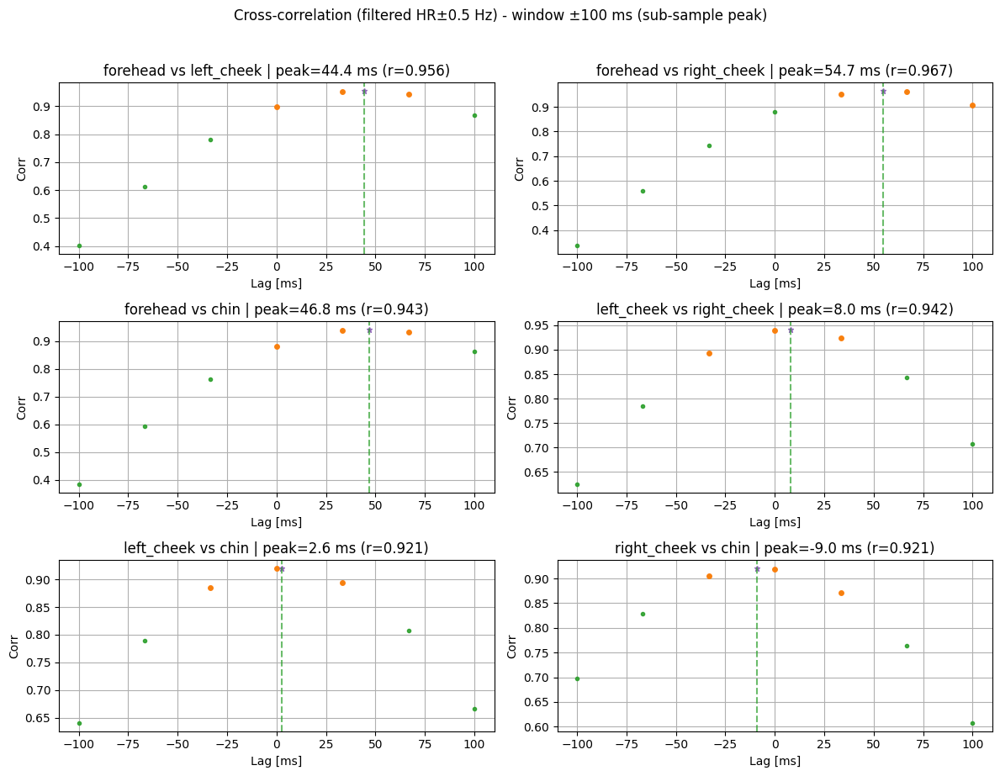

In [4]:
# Single video: All ROIs plots with peaks and cross-correlation (includes chin)
_ = plot_rois_xcorr_from_video(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    show_filtered=True, normalize=True,
    subsample_peak=True
)



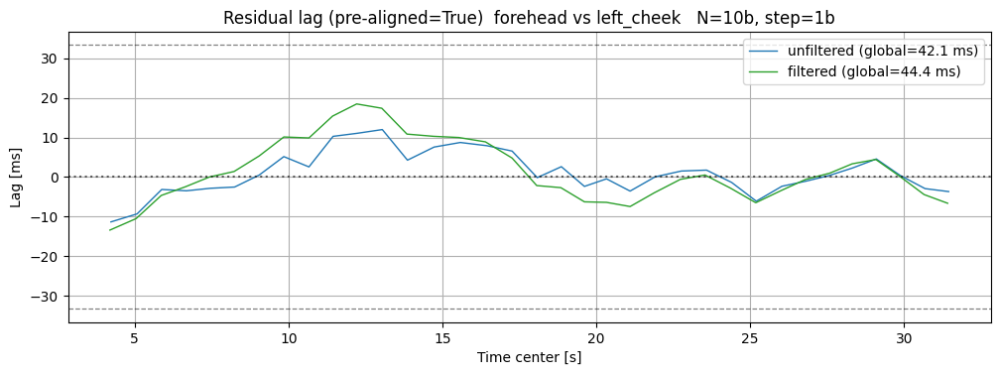

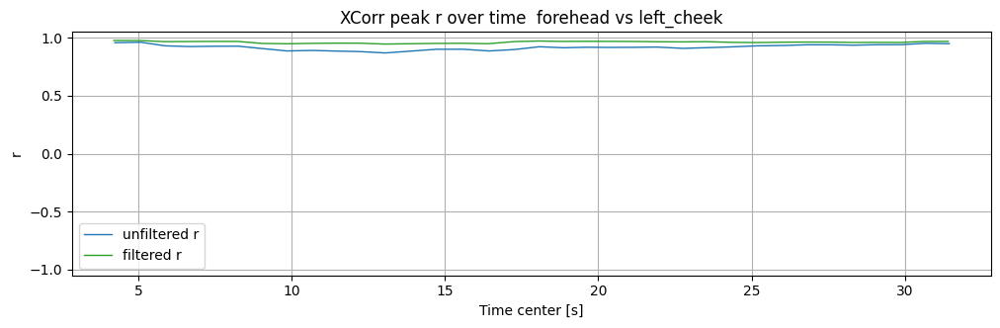

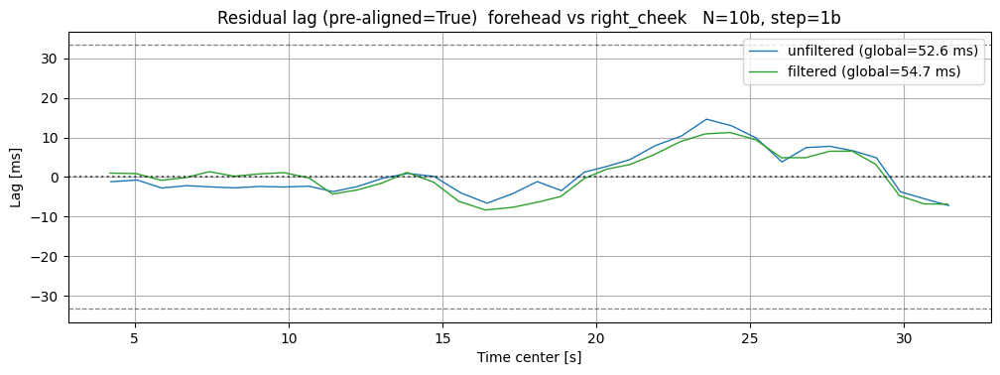

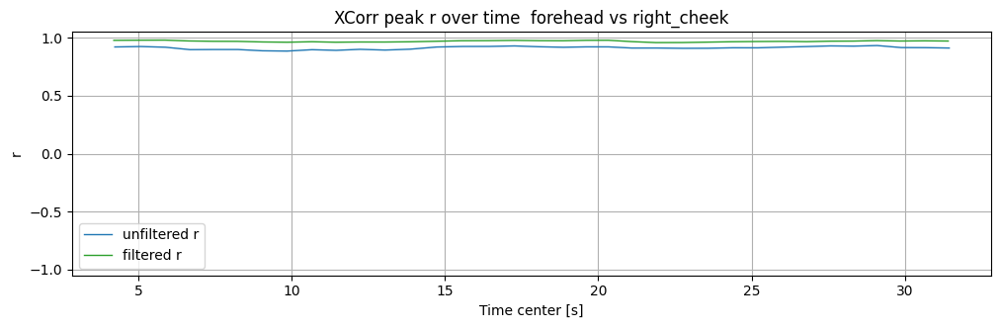

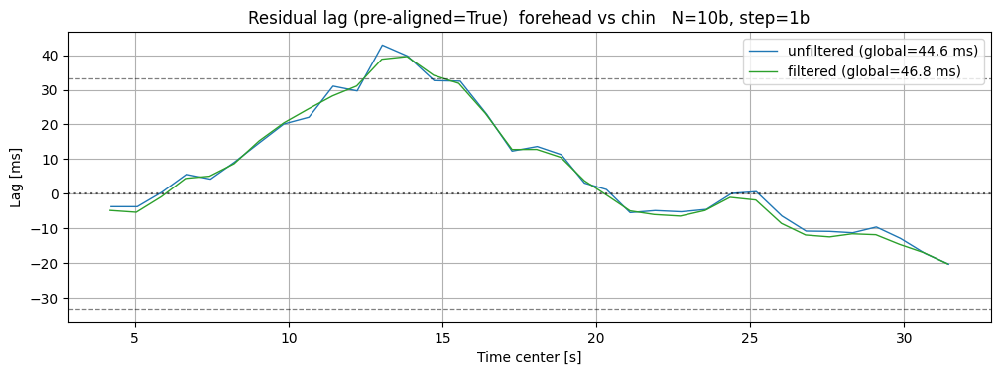

...

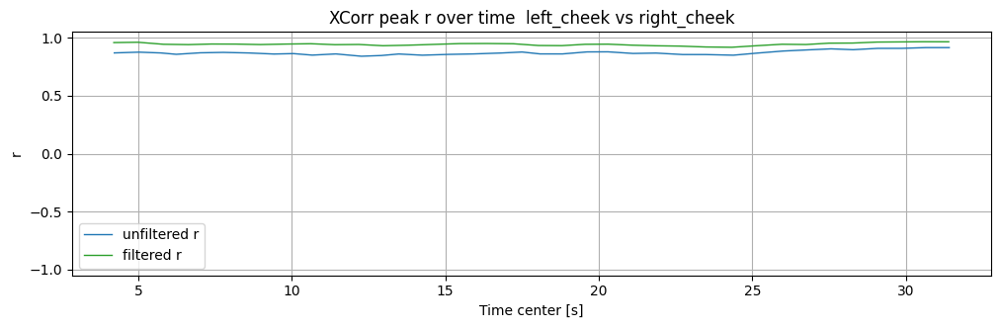

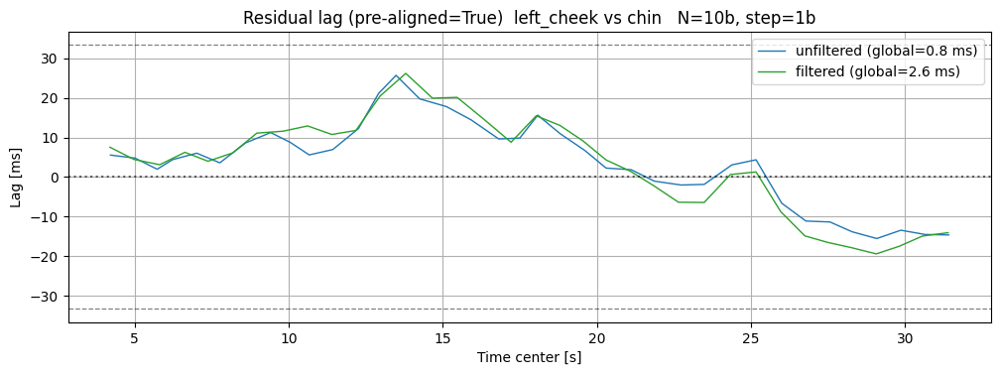

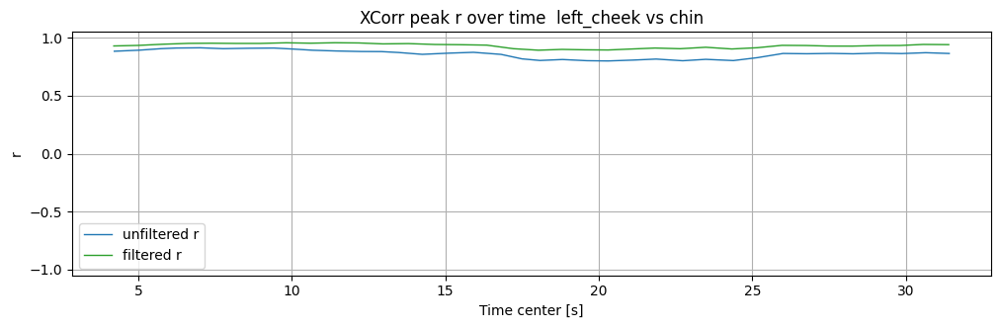

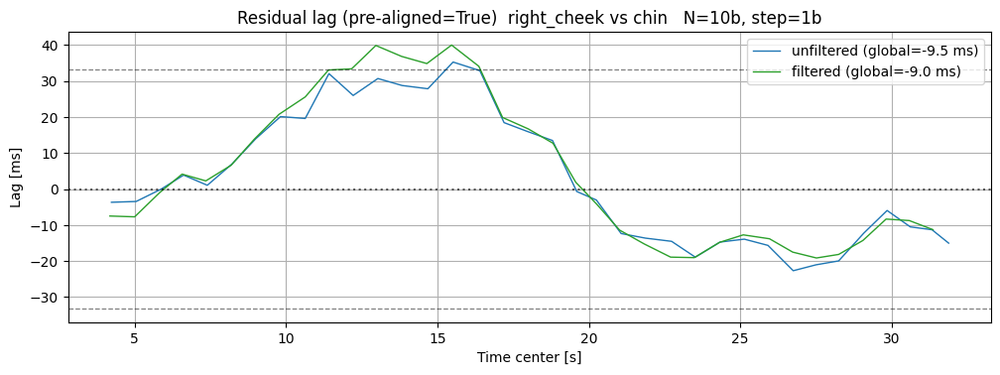

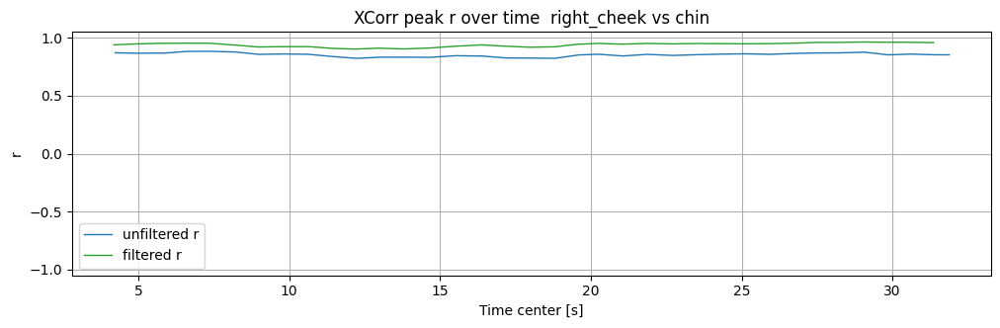

Computed sliding xcorr for ROI pairs:
  ('forehead', 'left_cheek')
  ('forehead', 'right_cheek')
  ('forehead', 'chin')
  ('left_cheek', 'right_cheek')
  ('left_cheek', 'chin')
  ('right_cheek', 'chin')


In [5]:
# Single video: Sliding cross-correlation (includes chin)
res_pairs = sliding_xcorr_lag_from_video(
    video_path=single_video_path,
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    n_beats=10, step_beats=1,
    peak_dist_s=0.3, max_lag_frac=0.25,
    prealign=True, prealign_max_lag_s=0.5,
    plot=True
)

print('Computed sliding xcorr for ROI pairs:')
for k in res_pairs.keys():
    print(' ', k)



In [4]:
# UBFC dataset-level analysis (DATASET_1 and DATASET_2) with chin
results_df, summary_df, failures_df, pair_ok, pair_bad = analyze_ubfc_lag_metrics_with_hr_filter(
    base_folder=base_folder,
    datasets=('DATASET_1', 'DATASET_2'),
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    n_beats=10,
    step_beats=1,
    hr_err_threshold_bpm=10.0,
    prealign=True,
    save_csv_path='ubfc_lag_metrics.csv',
    forehead=True, cheeks=True, under_nose=False, chin=True,
    min_global_r=0.7,          # example threshold
    use_interpolation=False, 
)

print('Results (per video / pair / mode):')
display(results_df.head(20))

print('Summary (aggregated per dataset / pair / mode):')
display(summary_df)

print('Failures:')
display(failures_df.head(20))



Results (per video / pair / mode):


,dataset,video_id,roi_a,roi_b,mode,gt_hr_bpm,global_lag_ms_precalc,global_r_precalc,global_lag_ms_refined,global_r_refined,...,iqr_residual_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,rms_residual_lag_ms,median_r,pct_windows_|lag|<=1frame,pct_windows_|lag|>1frame,pct_windows_|lag|>2frames,pct_windows_r>=0.8
5,DATASET_1,10-gt,forehead,chin,filtered,72.408340,33.333333,0.938215,33.333333,0.938215,...,33.333333,66.666667,81.904762,71.428571,84.327404,0.944554,0.000000,100.000000,40.000000,100.000000
4,DATASET_1,10-gt,forehead,chin,unfiltered,72.408340,33.333333,0.882906,33.333333,0.882906,...,33.333333,66.666667,81.904762,71.428571,84.327404,0.888137,0.000000,100.000000,40.000000,100.000000
1,DATASET_1,10-gt,forehead,left_cheek,filtered,72.408340,33.333333,0.952606,33.333333,0.952606,...,16.666667,66.666667,75.238095,69.047619,76.635604,0.946572,0.000000,100.000000,25.714286,100.000000
0,DATASET_1,10-gt,forehead,left_cheek,unfiltered,72.408340,33.333333,0.912610,33.333333,0.912610,...,0.000000,66.666667,69.523810,69.047619,70.147237,0.895966,0.000000,100.000000,8.571429,100.000000
3,DATASET_1,10-gt,forehead,right_cheek,filtered,72.408340,66.666667,0.962307,66.666667,0.962307,...,33.333333,133.333333,121.904762,130.952381,122.927259,0.941209,0.000000,100.000000,100.000000,100.000000
2,DATASET_1,10-gt,forehead,right_cheek,unfiltered,72.408340,66.666667,0.899768,66.666667,0.899768,...,33.333333,100.000000,113.333333,102.380952,114.503760,0.878291,0.000000,100.000000,100.000000,100.000000
9,DATASET_1,10-gt,left_cheek,chin,filtered,72.408340,0.000000,0.920711,0.000000,0.920711,...,0.000000,0.000000,5.714286,2.380952,13.801311,0.928044,100.000000,0.000000,0.000000,100.000000
8,DATASET_1,10-gt,left_cheek,chin,unfiltered,72.408340,0.000000,0.851609,0.000000,0.851609,...,0.000000,0.000000,3.603604,2.380952,10.959932,0.860615,100.000000,0.000000,0.000000,91.891892
7,DATASET_1,10-gt,left_cheek,right_cheek,filtered,72.408340,0.000000,0.940146,0.000000,0.940146,...,0.000000,0.000000,3.809524,2.380952,11.268723,0.941389,100.000000,0.000000,0.000000,100.000000
6,DATASET_1,10-gt,left_cheek,right_cheek,unfiltered,72.408340,0.000000,0.866137,0.000000,0.866137,...,0.000000,0.000000,7.207207,2.380952,15.499685,0.859553,100.000000,0.000000,0.000000,100.000000


Summary (aggregated per dataset / pair / mode):


,dataset,roi_a,roi_b,mode,videos,n_windows,median_global_lag_ms,median_global_r,median_residual_lag_ms,median_iqr_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,median_rms_residual_lag_ms,mean_pct_within_1frame,mean_pct_over_1frame,mean_pct_over_2frames,mean_pct_high_r
0,DATASET_1,forehead,chin,filtered,7,509,33.333333,0.878017,66.666667,33.333333,66.666667,52.177707,66.666667,61.666984,38.066690,61.933310,11.604997,84.051095
1,DATASET_1,forehead,chin,unfiltered,6,437,33.333333,0.823903,66.666667,33.333333,66.666667,56.299314,67.559524,62.747729,32.662386,67.337614,12.380403,73.983900
2,DATASET_1,forehead,left_cheek,filtered,8,598,33.333333,0.891848,66.666667,0.000000,66.666667,50.769286,65.625000,63.957485,42.337671,57.662329,8.684239,87.253492
3,DATASET_1,forehead,left_cheek,unfiltered,8,603,33.333333,0.817230,66.666667,0.000000,66.666667,45.476324,65.625000,63.581013,44.163148,55.836852,4.807375,60.890794
4,DATASET_1,forehead,right_cheek,filtered,7,526,33.333333,0.912406,66.666667,33.333333,66.666667,60.412338,64.583333,61.864048,34.494156,65.505844,15.248796,95.518531
5,DATASET_1,forehead,right_cheek,unfiltered,7,531,33.333333,0.826340,66.666667,33.333333,66.666667,57.905621,64.583333,59.645572,38.370256,61.629744,15.834798,64.779332
6,DATASET_1,left_cheek,chin,filtered,6,432,0.000000,0.810236,0.000000,33.333333,16.666667,30.952604,16.815476,34.298453,75.128508,24.871492,7.320336,77.171235
7,DATASET_1,left_cheek,chin,unfiltered,3,178,0.000000,0.822276,0.000000,0.000000,0.000000,7.823584,2.380952,18.002057,99.033816,0.966184,0.000000,79.000196
8,DATASET_1,left_cheek,right_cheek,filtered,7,527,0.000000,0.850012,0.000000,0.000000,0.000000,9.756103,2.380952,16.859351,99.432492,0.567508,0.000000,85.664638
9,DATASET_1,left_cheek,right_cheek,unfiltered,5,381,0.000000,0.768926,0.000000,0.000000,0.000000,8.689483,2.083333,15.066559,99.166667,0.833333,0.000000,55.746249


Failures:


,dataset,video_id,gt_hr_bpm,reason,hr_forehead,err_forehead,hr_left_cheek,err_left_cheek,hr_right_cheek,err_right_cheek,hr_chin,err_chin
0,DATASET_2,subject11,96.210504,Less than 2 ROIs with HR error < 10.0 bpm,126.56250,30.351996,126.56250,30.351996,126.56250,30.351996,126.56250,30.351996
1,DATASET_2,subject14,80.412426,Less than 2 ROIs with HR error < 10.0 bpm,70.31250,10.099926,70.31250,10.099926,77.34375,3.068676,70.31250,10.099926
2,DATASET_2,subject18,103.762247,Less than 2 ROIs with HR error < 10.0 bpm,126.56250,22.800253,126.56250,22.800253,126.56250,22.800253,126.56250,22.800253
3,DATASET_2,subject20,60.225089,Less than 2 ROIs with HR error < 10.0 bpm,133.59375,73.368661,133.59375,73.368661,133.59375,73.368661,133.59375,73.368661
4,DATASET_2,subject24,84.591673,Less than 2 ROIs with HR error < 10.0 bpm,98.43750,13.845827,98.43750,13.845827,98.43750,13.845827,98.43750,13.845827
5,DATASET_2,subject25,91.532873,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,20.967127,112.50000,20.967127,112.50000,20.967127,112.50000,20.967127
6,DATASET_2,subject26,73.534714,Less than 2 ROIs with HR error < 10.0 bpm,98.43750,24.902786,98.43750,24.902786,98.43750,24.902786,98.43750,24.902786
7,DATASET_2,subject27,89.366702,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,23.133298,112.50000,23.133298,112.50000,23.133298,112.50000,23.133298
8,DATASET_2,subject35,102.357953,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,10.142047,112.50000,10.142047,112.50000,10.142047,112.50000,10.142047


In [8]:
display(summary_df)

,dataset,roi_a,roi_b,mode,videos,n_windows,median_global_lag_ms,median_global_r,median_residual_lag_ms,median_iqr_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,median_rms_residual_lag_ms,mean_pct_within_1frame,mean_pct_over_1frame,mean_pct_over_2frames,mean_pct_high_r
0,DATASET_1,forehead,chin,filtered,7,509,33.333333,0.878017,66.666667,33.333333,66.666667,52.177707,66.666667,61.666984,38.066690,61.933310,11.604997,84.051095
1,DATASET_1,forehead,chin,unfiltered,6,437,33.333333,0.823903,66.666667,33.333333,66.666667,56.299314,67.559524,62.747729,32.662386,67.337614,12.380403,73.983900
2,DATASET_1,forehead,left_cheek,filtered,8,598,33.333333,0.891848,66.666667,0.000000,66.666667,50.769286,65.625000,63.957485,42.337671,57.662329,8.684239,87.253492
3,DATASET_1,forehead,left_cheek,unfiltered,8,603,33.333333,0.817230,66.666667,0.000000,66.666667,45.476324,65.625000,63.581013,44.163148,55.836852,4.807375,60.890794
4,DATASET_1,forehead,right_cheek,filtered,7,526,33.333333,0.912406,66.666667,33.333333,66.666667,60.412338,64.583333,61.864048,34.494156,65.505844,15.248796,95.518531
5,DATASET_1,forehead,right_cheek,unfiltered,7,531,33.333333,0.826340,66.666667,33.333333,66.666667,57.905621,64.583333,59.645572,38.370256,61.629744,15.834798,64.779332
6,DATASET_1,left_cheek,chin,filtered,6,432,0.000000,0.810236,0.000000,33.333333,16.666667,30.952604,16.815476,34.298453,75.128508,24.871492,7.320336,77.171235
7,DATASET_1,left_cheek,chin,unfiltered,3,178,0.000000,0.822276,0.000000,0.000000,0.000000,7.823584,2.380952,18.002057,99.033816,0.966184,0.000000,79.000196
8,DATASET_1,left_cheek,right_cheek,filtered,7,527,0.000000,0.850012,0.000000,0.000000,0.000000,9.756103,2.380952,16.859351,99.432492,0.567508,0.000000,85.664638
9,DATASET_1,left_cheek,right_cheek,unfiltered,5,381,0.000000,0.768926,0.000000,0.000000,0.000000,8.689483,2.083333,15.066559,99.166667,0.833333,0.000000,55.746249


# UBFC Interpolated results

In [9]:
# UBFC dataset-level analysis (DATASET_1 and DATASET_2) with chin
results_df, summary_df, failures_df, pair_ok, pair_bad = analyze_ubfc_lag_metrics_with_hr_filter(
    base_folder=base_folder,
    datasets=('DATASET_1', 'DATASET_2'),
    fs=fs,
    window_length=window_length,
    start_time=start_time,
    n_beats=10,
    step_beats=1,
    hr_err_threshold_bpm=10.0,
    prealign=True,
    save_csv_path='ubfc_lag_metrics_interpolated.csv',
    forehead=True, cheeks=True, under_nose=False, chin=True,
    min_global_r=0.7,          # example threshold
    use_interpolation=True, 
)

print('Results (per video / pair / mode):')
display(results_df.head(20))

print('Summary (aggregated per dataset / pair / mode):')
display(summary_df)

print('Failures:')
display(failures_df.head(20))



Results (per video / pair / mode):


,dataset,video_id,roi_a,roi_b,mode,gt_hr_bpm,global_lag_ms_precalc,global_r_precalc,global_lag_ms_refined,global_r_refined,...,iqr_residual_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,rms_residual_lag_ms,median_r,pct_windows_|lag|<=1frame,pct_windows_|lag|>1frame,pct_windows_|lag|>2frames,pct_windows_r>=0.8
5,DATASET_1,10-gt,forehead,chin,filtered,72.408340,46.768723,0.943421,46.768723,0.943421,...,24.154758,11.884143,14.026955,3.208839,17.854428,0.960914,91.428571,8.571429,0.0,100.000000
4,DATASET_1,10-gt,forehead,chin,unfiltered,72.408340,44.579742,0.886520,44.579742,0.886520,...,22.778641,10.925306,13.643305,3.131730,17.852978,0.912391,94.285714,5.714286,0.0,100.000000
1,DATASET_1,10-gt,forehead,left_cheek,filtered,72.408340,44.440628,0.956233,44.440628,0.956233,...,11.315618,4.785201,6.203656,1.320868,7.880321,0.962517,100.000000,0.000000,0.0,100.000000
0,DATASET_1,10-gt,forehead,left_cheek,unfiltered,72.408340,42.056159,0.914992,42.056159,0.914992,...,7.099982,2.931827,4.193003,0.903544,5.446663,0.919550,100.000000,0.000000,0.0,100.000000
3,DATASET_1,10-gt,forehead,right_cheek,filtered,72.408340,54.657814,0.966583,54.657814,0.966583,...,7.827400,4.303904,4.216652,0.951209,5.318438,0.969487,100.000000,0.000000,0.0,100.000000
2,DATASET_1,10-gt,forehead,right_cheek,unfiltered,72.408340,52.615627,0.905755,52.615627,0.905755,...,7.405090,3.689209,4.494688,3.243225,5.674468,0.914392,100.000000,0.000000,0.0,100.000000
9,DATASET_1,10-gt,left_cheek,chin,filtered,72.408340,2.602790,0.920901,2.602790,0.920901,...,18.075852,11.089621,10.961949,6.100346,12.698119,0.933737,100.000000,0.000000,0.0,100.000000
8,DATASET_1,10-gt,left_cheek,chin,unfiltered,72.408340,0.811123,0.851627,0.811123,0.851627,...,11.703543,8.759202,9.421697,2.808002,11.185835,0.864734,100.000000,0.000000,0.0,97.297297
7,DATASET_1,10-gt,left_cheek,right_cheek,filtered,72.408340,8.038786,0.942007,8.038786,0.942007,...,15.310024,7.939960,7.710283,1.854247,9.200495,0.943533,100.000000,0.000000,0.0,100.000000
6,DATASET_1,10-gt,left_cheek,right_cheek,unfiltered,72.408340,10.204457,0.869257,10.204457,0.869257,...,11.148040,5.956348,6.273233,3.341372,7.567870,0.867608,100.000000,0.000000,0.0,100.000000


Summary (aggregated per dataset / pair / mode):


,dataset,roi_a,roi_b,mode,videos,n_windows,median_global_lag_ms,median_global_r,median_residual_lag_ms,median_iqr_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,median_rms_residual_lag_ms,mean_pct_within_1frame,mean_pct_over_1frame,mean_pct_over_2frames,mean_pct_high_r
0,DATASET_1,forehead,chin,filtered,7,509,27.912840,0.878943,0.426973,19.364995,9.006419,11.722247,3.208839,14.111886,94.783058,5.216942,0.927644,84.183371
1,DATASET_1,forehead,chin,unfiltered,6,437,31.566631,0.828079,0.335752,14.564966,7.820191,9.661657,2.716206,13.216789,97.626802,2.373198,0.000000,75.723785
2,DATASET_1,forehead,left_cheek,filtered,8,598,32.099119,0.891950,-0.474325,14.611510,7.978540,10.713804,2.820804,13.489149,96.162428,3.837572,0.000000,90.309680
3,DATASET_1,forehead,left_cheek,unfiltered,8,603,30.219903,0.817631,-0.066913,13.117083,7.064675,9.617585,2.339871,12.491312,96.622144,3.377856,0.000000,66.258504
4,DATASET_1,forehead,right_cheek,filtered,7,526,25.212381,0.916863,-0.403084,13.317030,6.381629,8.202768,1.814753,9.775446,98.701299,1.298701,0.000000,96.528420
5,DATASET_1,forehead,right_cheek,unfiltered,7,531,24.697528,0.828943,-0.376462,14.324950,7.056930,8.199882,2.146616,10.814398,98.685085,1.314915,0.000000,71.199856
6,DATASET_1,left_cheek,chin,filtered,6,432,5.650430,0.811237,3.150023,23.203402,12.373497,15.814253,9.694022,19.452095,88.232228,11.767772,0.387597,82.377469
7,DATASET_1,left_cheek,chin,unfiltered,3,178,1.503624,0.822336,4.770355,14.680924,8.759202,11.951270,6.104642,13.297523,95.652174,4.347826,0.000000,81.727924
8,DATASET_1,left_cheek,right_cheek,filtered,7,527,-3.321133,0.850790,0.059768,18.427823,9.290333,12.408419,4.391696,13.351787,94.007696,5.992304,0.183150,86.392659
9,DATASET_1,left_cheek,right_cheek,unfiltered,5,381,-0.423211,0.771593,-1.047214,15.676960,7.855969,10.861484,4.262030,11.016183,95.833333,4.166667,0.000000,58.471730


Failures:


,dataset,video_id,gt_hr_bpm,reason,hr_forehead,err_forehead,hr_left_cheek,err_left_cheek,hr_right_cheek,err_right_cheek,hr_chin,err_chin
0,DATASET_2,subject11,96.210504,Less than 2 ROIs with HR error < 10.0 bpm,126.56250,30.351996,126.56250,30.351996,126.56250,30.351996,126.56250,30.351996
1,DATASET_2,subject14,80.412426,Less than 2 ROIs with HR error < 10.0 bpm,70.31250,10.099926,70.31250,10.099926,77.34375,3.068676,70.31250,10.099926
2,DATASET_2,subject18,103.762247,Less than 2 ROIs with HR error < 10.0 bpm,126.56250,22.800253,126.56250,22.800253,126.56250,22.800253,126.56250,22.800253
3,DATASET_2,subject20,60.225089,Less than 2 ROIs with HR error < 10.0 bpm,133.59375,73.368661,133.59375,73.368661,133.59375,73.368661,133.59375,73.368661
4,DATASET_2,subject24,84.591673,Less than 2 ROIs with HR error < 10.0 bpm,98.43750,13.845827,98.43750,13.845827,98.43750,13.845827,98.43750,13.845827
5,DATASET_2,subject25,91.532873,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,20.967127,112.50000,20.967127,112.50000,20.967127,112.50000,20.967127
6,DATASET_2,subject26,73.534714,Less than 2 ROIs with HR error < 10.0 bpm,98.43750,24.902786,98.43750,24.902786,98.43750,24.902786,98.43750,24.902786
7,DATASET_2,subject27,89.366702,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,23.133298,112.50000,23.133298,112.50000,23.133298,112.50000,23.133298
8,DATASET_2,subject35,102.357953,Less than 2 ROIs with HR error < 10.0 bpm,112.50000,10.142047,112.50000,10.142047,112.50000,10.142047,112.50000,10.142047


In [ ]:
summarize_ubfc_global_lag_by_frames_per_roi

In [10]:
from roi_analysis import summarize_ubfc_global_lag_by_frames_per_roi

overall_by_mode, per_roi_total, per_roi_pair = summarize_ubfc_global_lag_by_frames_per_roi(
    csv_path="ubfc_lag_metrics_interpolated.csv",
    fs=30,
)

display(overall_by_mode)
display(per_roi_total)
display(per_roi_pair)

c:\Users\pedro\edge-rppg-health\roi_analysis.py:1816: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  overall_by_mode = df.groupby(extra + ["mode"], dropna=False).apply(_summ).reset_index()
c:\Users\pedro\edge-rppg-health\roi_analysis.py:1827: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_roi_total = long_df.groupby(extra + ["mode", "roi"], dropna=False).apply(_summ).reset_index()
c:\Users\pedro\edge-rppg-health\ro

,mode,n_rows,pct_0step,pct_ge_1step,pct_ge_2step
0,filtered,187.0,50.267380,49.732620,4.812834
1,total,300.0,51.666667,48.333333,3.333333
2,unfiltered,113.0,53.982301,46.017699,0.884956


,mode,roi,n_rows,pct_0step,pct_ge_1step,pct_ge_2step
0,filtered,chin,80.0,55.000000,45.000000,6.250000
1,filtered,forehead,106.0,34.905660,65.094340,2.830189
2,filtered,left_cheek,94.0,57.446809,42.553191,4.255319
3,filtered,right_cheek,94.0,56.382979,43.617021,6.382979
4,total,chin,114.0,55.263158,44.736842,4.385965
5,total,forehead,187.0,36.898396,63.101604,2.139037
6,total,left_cheek,149.0,60.402685,39.597315,2.684564
7,total,right_cheek,150.0,58.666667,41.333333,4.666667
8,unfiltered,chin,34.0,55.882353,44.117647,0.000000
9,unfiltered,forehead,81.0,39.506173,60.493827,1.234568


,mode,roi_a,roi_b,n_rows,pct_0step,pct_ge_1step,pct_ge_2step
0,filtered,chin,forehead,31.0,41.935484,58.064516,3.225806
1,filtered,chin,left_cheek,24.0,58.333333,41.666667,8.333333
2,filtered,chin,right_cheek,25.0,68.000000,32.000000,8.000000
3,filtered,forehead,left_cheek,38.0,36.842105,63.157895,0.000000
4,filtered,forehead,right_cheek,37.0,27.027027,72.972973,5.405405
5,filtered,left_cheek,right_cheek,32.0,81.250000,18.750000,6.250000
6,total,chin,forehead,49.0,38.775510,61.224490,2.040816
7,total,chin,left_cheek,30.0,63.333333,36.666667,6.666667
8,total,chin,right_cheek,35.0,71.428571,28.571429,5.714286
9,total,forehead,left_cheek,71.0,40.845070,59.154930,0.000000


## Preview chin ROI overlay on 10-gt

Press 'q' or ESC to close the video window. This previews only the chin ROI box.



In [16]:
from IppgSignalObtainer import IppgSignalObtainer

rois = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_1/5-gt/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



## Plot all ROIs from precomputed `rois` (POS + peaks + xcorr)
If `rois` is not defined yet, this cell will extract ROIs first (forehead, cheeks, under_nose, chin).



In [3]:
from typing import Dict, List, Tuple
import numpy as np
from IppgSignalObtainer import IppgSignalObtainer
from roi_analysis import _bandpass_hr, plot_all_rois_signals_and_xcorr
from Tools.ParametersCalculator import ParametersCalculator

def plot_rois_xcorr_from_precomputed_rois(
    rois_rgb: Dict[str, Dict[str, List[float]]],
    fs: float,
    show_filtered: bool = True,
    normalize: bool = True,
    plot_individual: bool = False
) -> Tuple[Dict[str, np.ndarray], Dict[str, np.ndarray]]:
    """
    Start from an already-extracted rois_rgb:
      { roi_name: { 'red': [...], 'green': [...], 'blue': [...] } }
    Compute POS per ROI, build HR±0.5 Hz filtered versions, plot, and return both.
    """
    if not isinstance(rois_rgb, dict) or len(rois_rgb) == 0:
        raise ValueError("rois_rgb is empty or invalid.")

    # POS per ROI
    pos_signals: Dict[str, np.ndarray] = {}
    for roi, ch in rois_rgb.items():
        r, g, b = ch.get('red', []), ch.get('green', []), ch.get('blue', [])
        if len(r) and len(g) and len(b):
            pos = IppgSignalObtainer.GetRppGSeriesfromRGBSeries(
                r, g, b, fs, normalize=False, derivative=False, bandpass=True, detrend=True, method='pos'
            )
            pos_signals[roi] = np.asarray(pos)

    if len(pos_signals) < 1:
        raise ValueError("No valid POS signals by ROI in rois_rgb.")

    # Narrow-band per ROI around its own HR
    calc = ParametersCalculator()
    pos_signals_narrow: Dict[str, np.ndarray] = {}
    for roi, sig in pos_signals.items():
        hr_bpm = float(calc.ObtainHeartRate(np.asarray(sig), np.array([]), fs, method='two_peaks_periodogram'))
        pos_signals_narrow[roi] = _bandpass_hr(sig, fs, hr_bpm, half_width_hz=0.5)

    # Plots (unfiltered and filtered)
    plot_all_rois_signals_and_xcorr(
        pos_signals=pos_signals,
        pos_signals_narrow=pos_signals_narrow,
        fs=fs,
        show_filtered=show_filtered,
        normalize=normalize,
        plot_individual = plot_individual,
    )

    return pos_signals, pos_signals_narrow

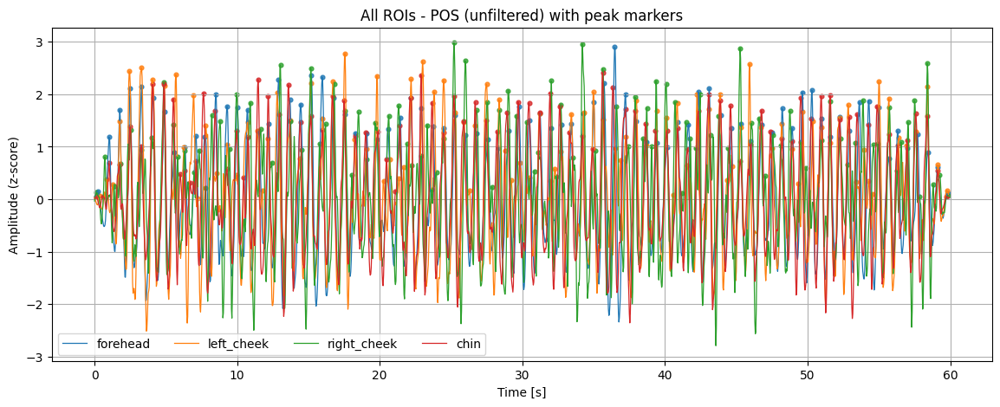

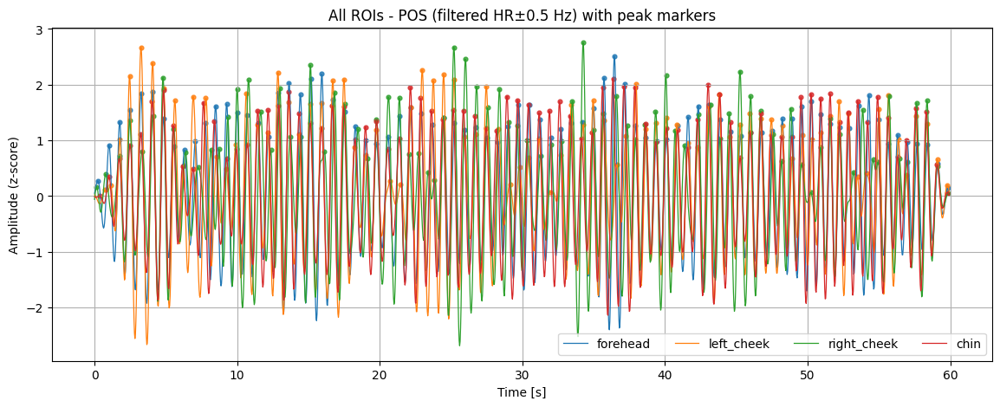

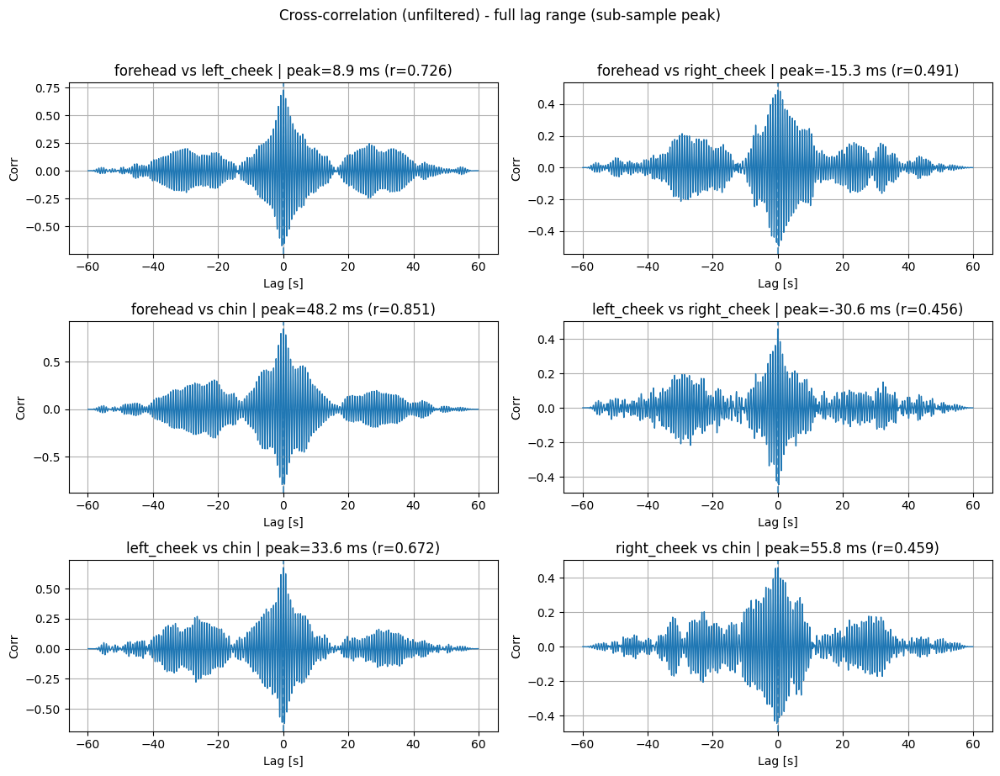

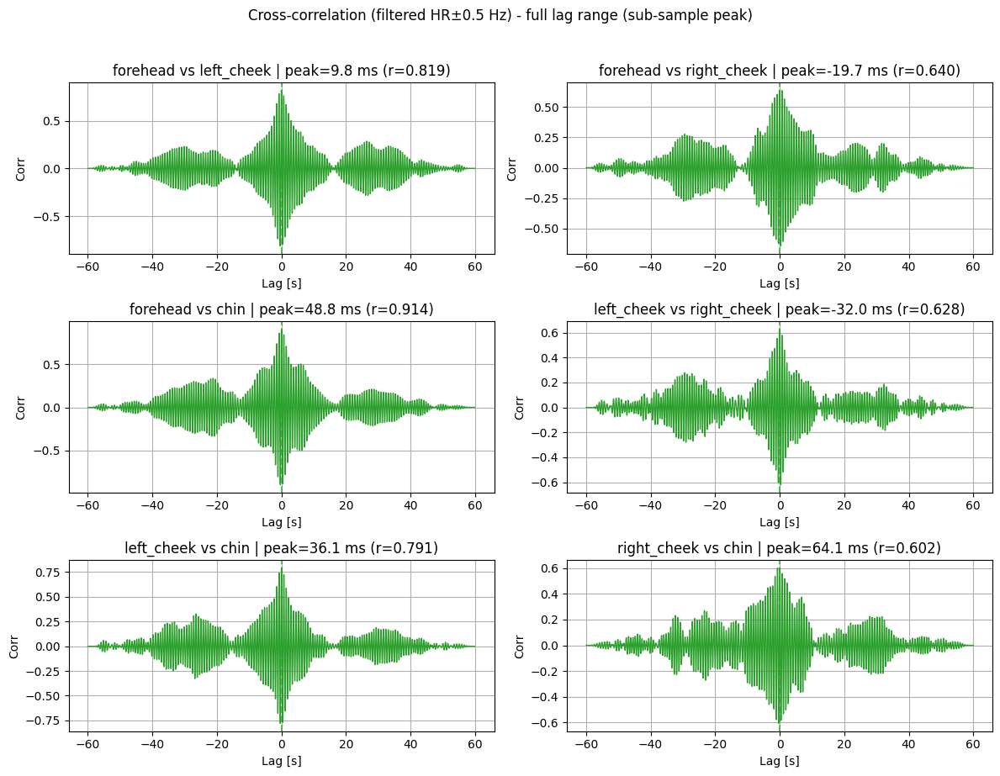

In [ ]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois,
    fs=30,
    show_filtered=True,
    normalize=True,
)



## 10 gt

In [9]:
from IppgSignalObtainer import IppgSignalObtainer

rois_10gt = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_1/10-gt/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



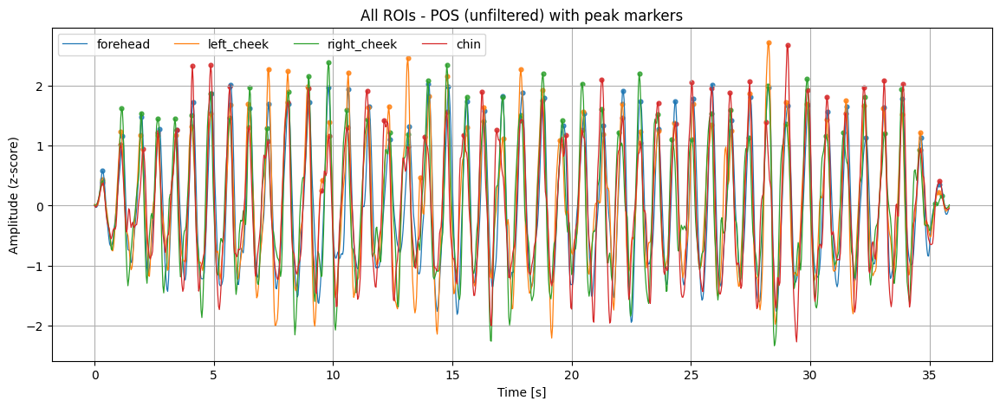

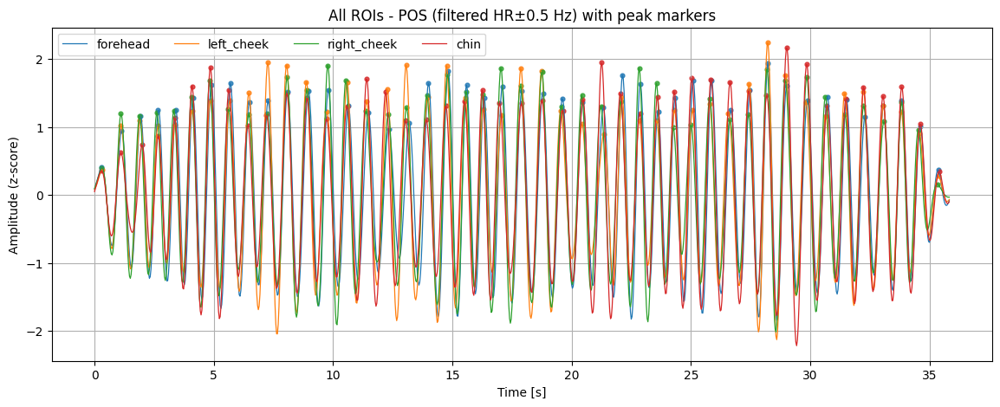

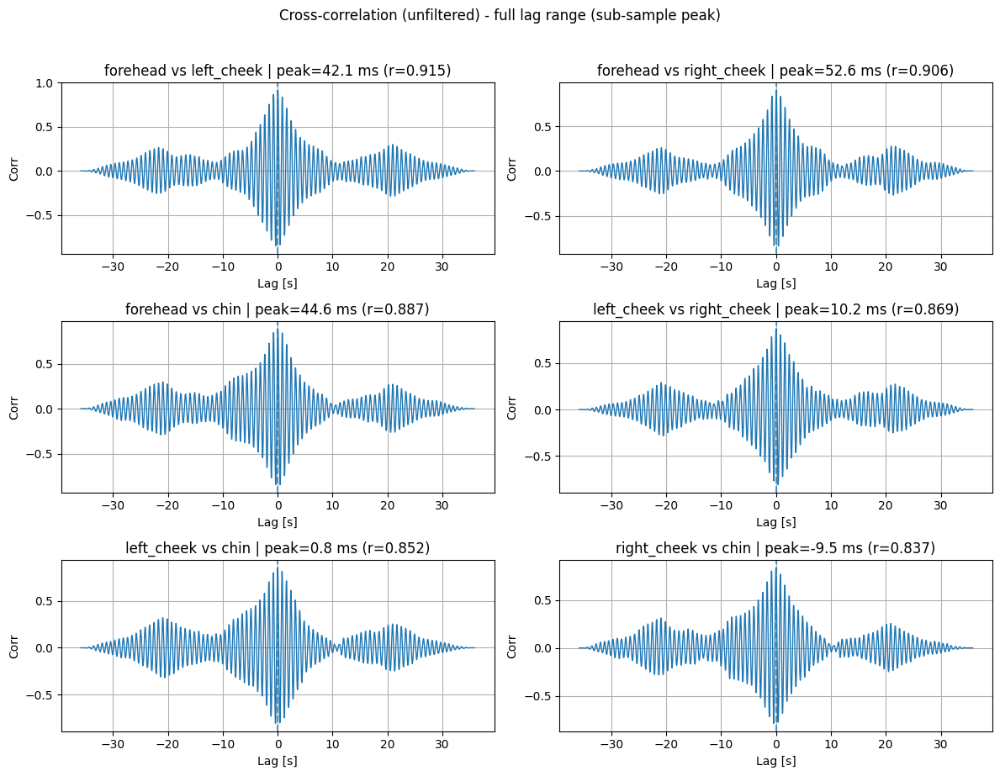

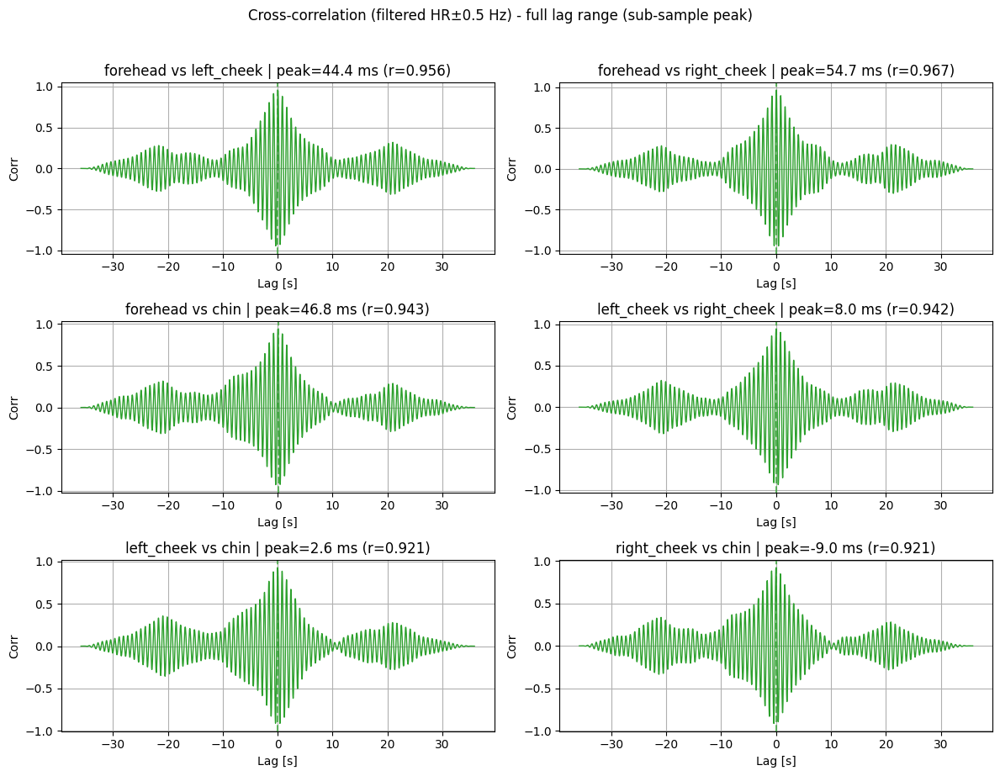

In [14]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_10gt,
    fs=30,
    show_filtered=True,
    normalize=True,
)

## 8 gt

In [10]:
from IppgSignalObtainer import IppgSignalObtainer

rois_8gt = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_1/8-gt/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



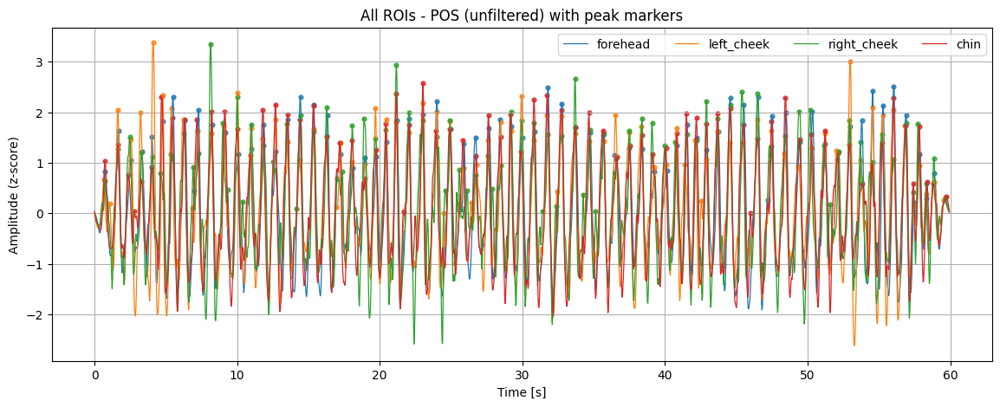

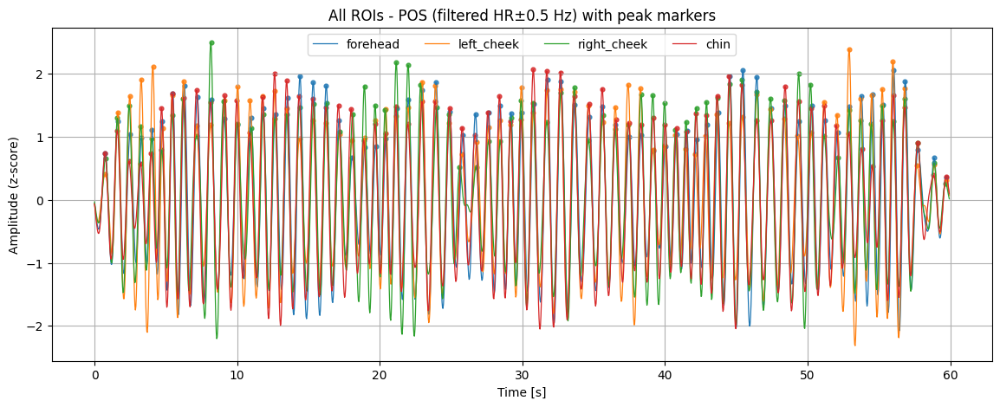

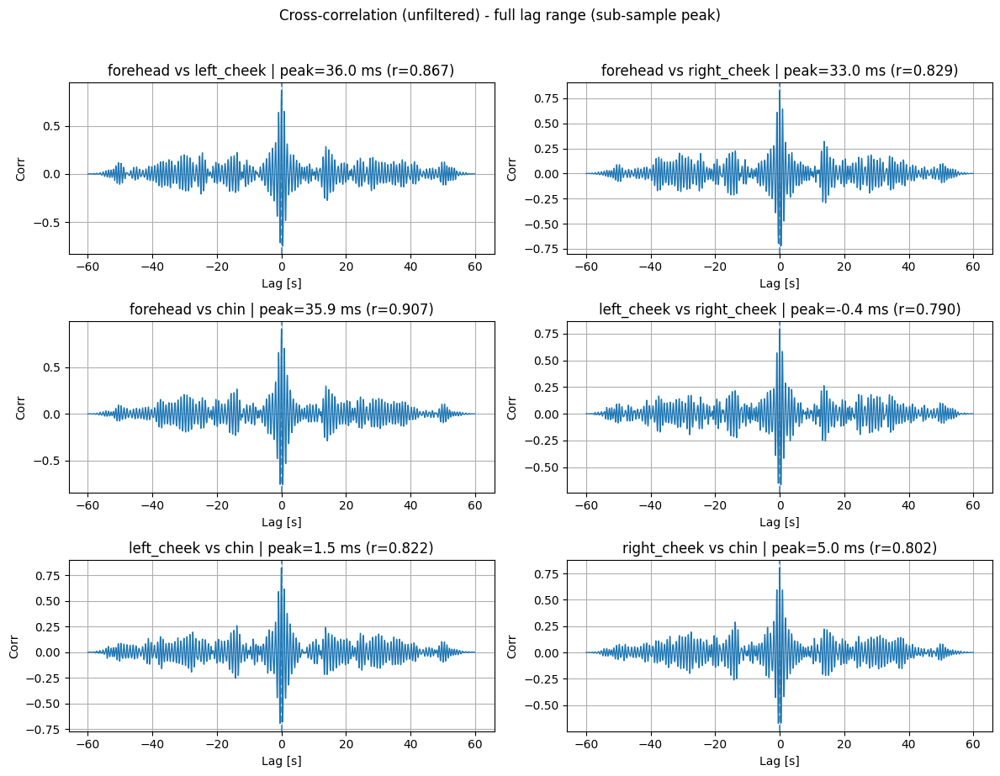

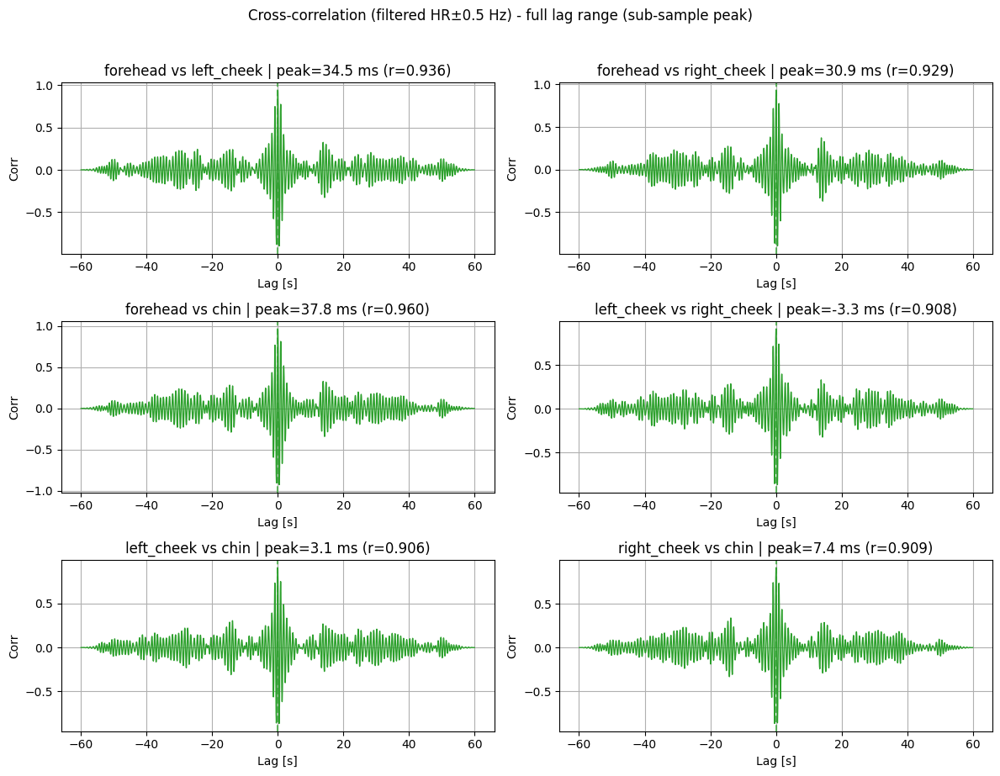

In [10]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_8gt,
    fs=30,
    show_filtered=True,
    normalize=True,
)

## subject 1

In [11]:
from IppgSignalObtainer import IppgSignalObtainer

rois_subj1 = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "UBFC_DATASET_MERGED/DATASET_2/subject1/vid.avi", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)



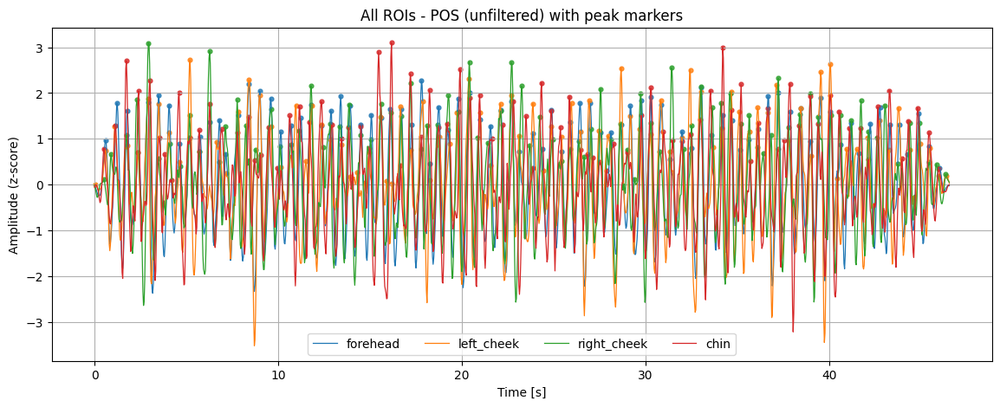

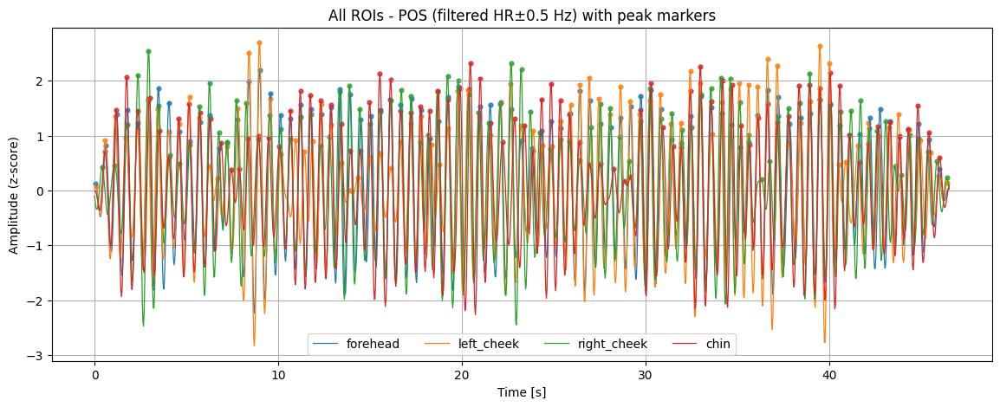

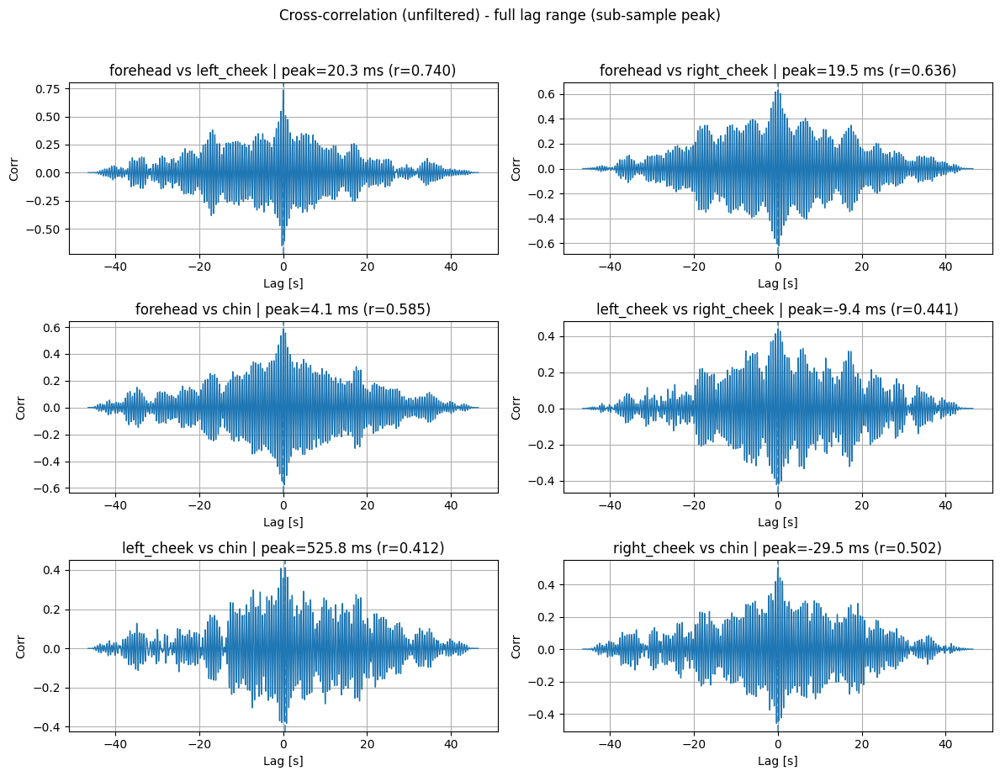

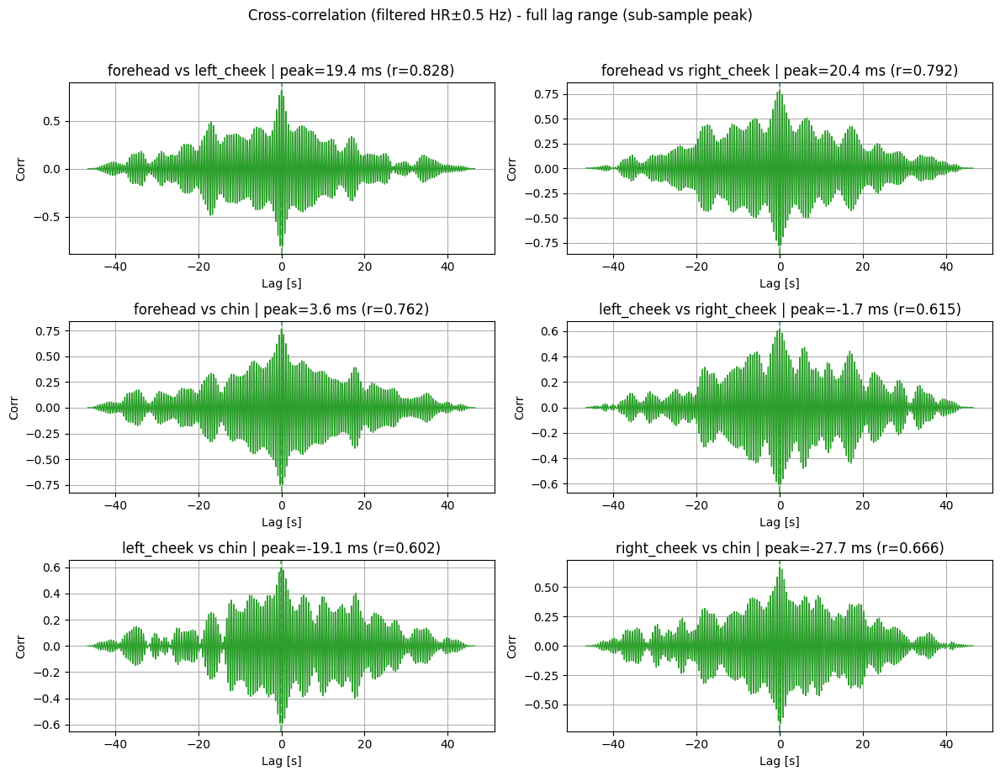

In [ ]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_subj1,
    fs=30,
    show_filtered=True,
    normalize=True,
)

## MI VIDEO A 60

In [3]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "video_lossless_20251210_025414.mkv", 60,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)

In [1]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_lossless_20251210_030306 = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "video_lossless_20251210_030306.mkv", 60,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=True
)

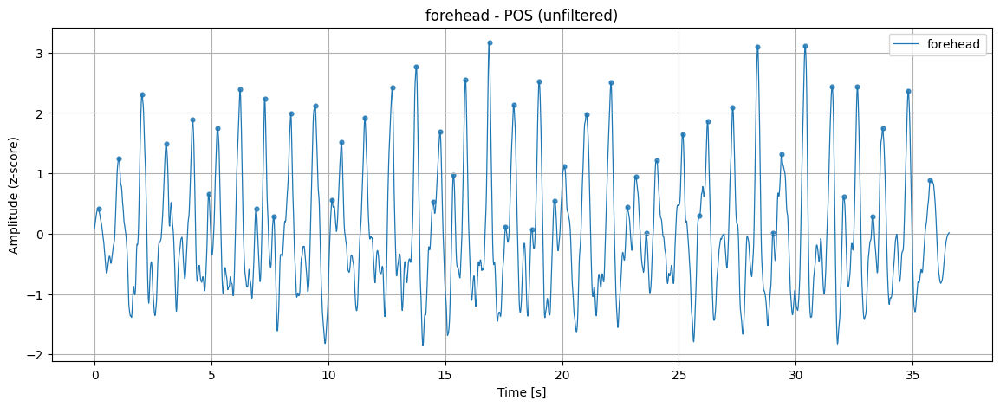

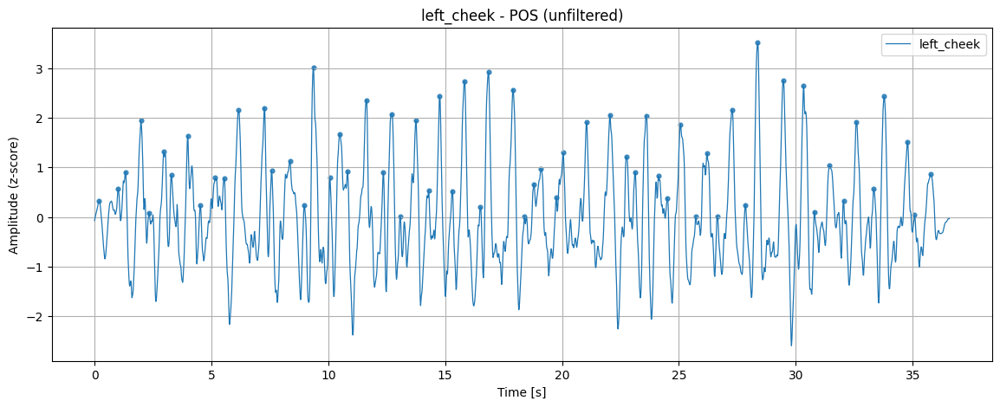

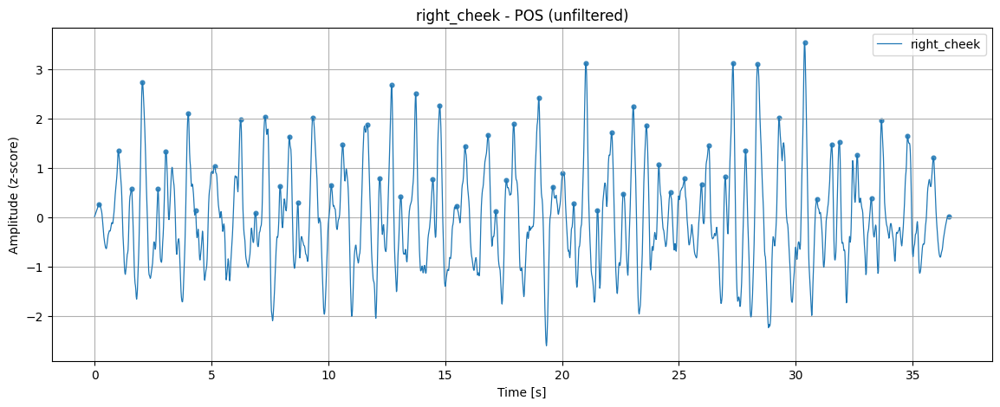

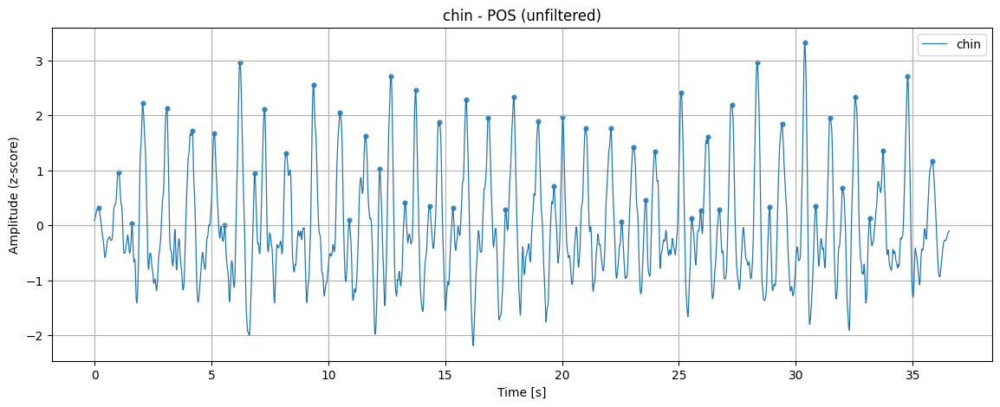

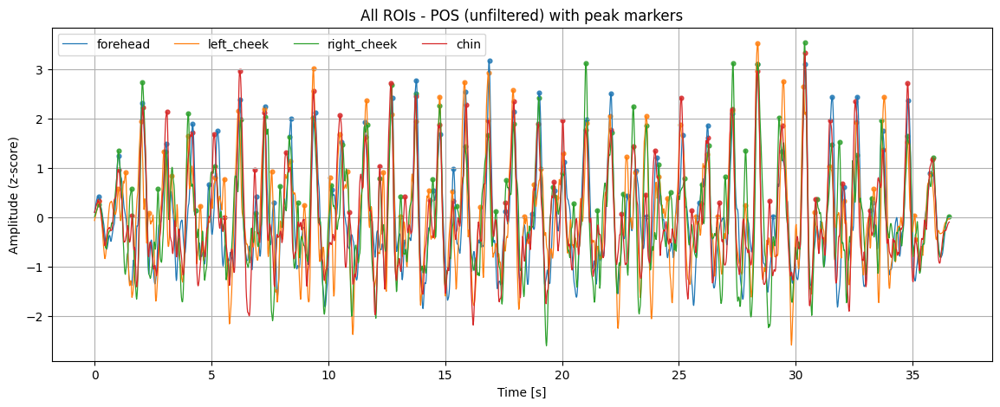

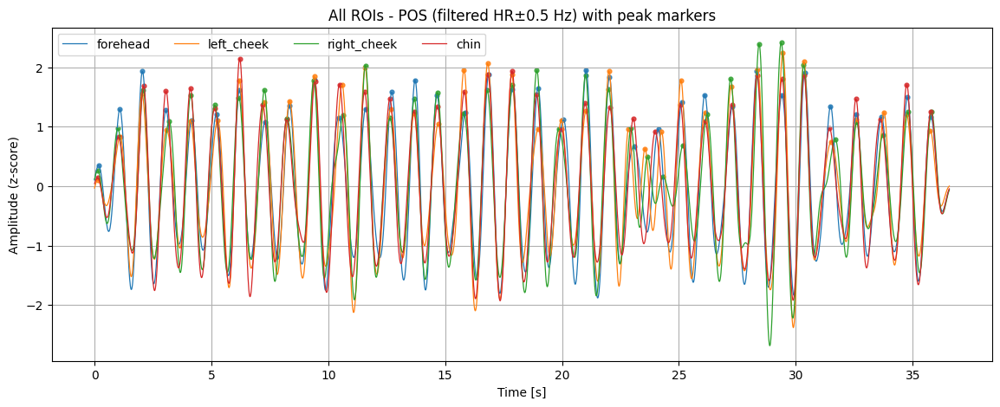

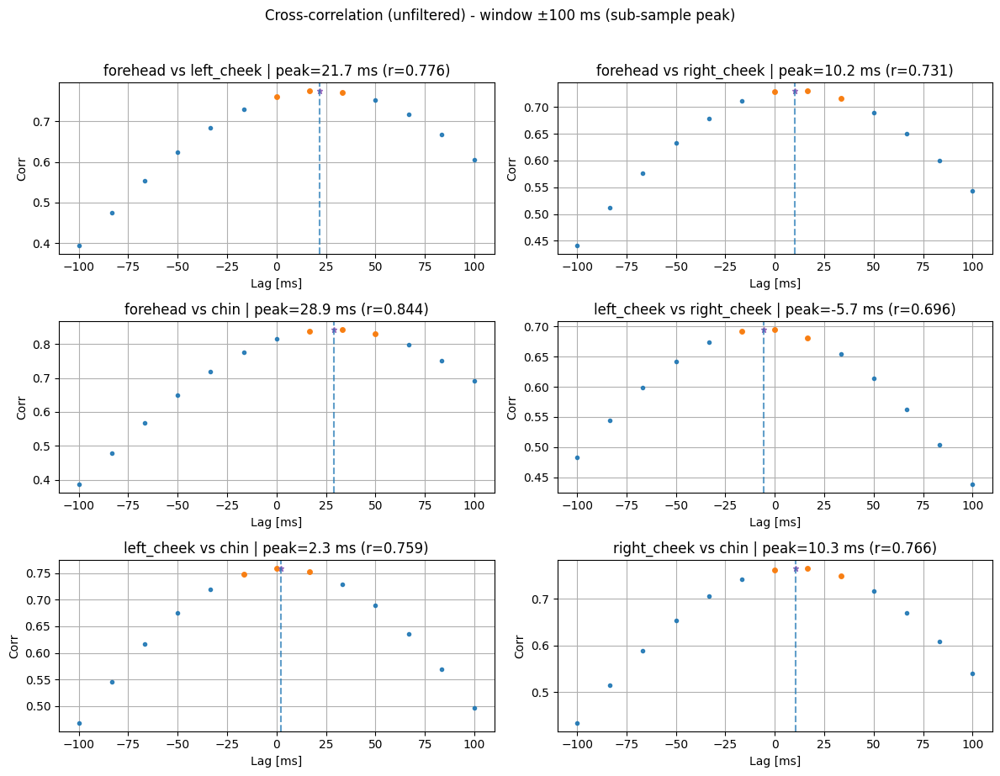

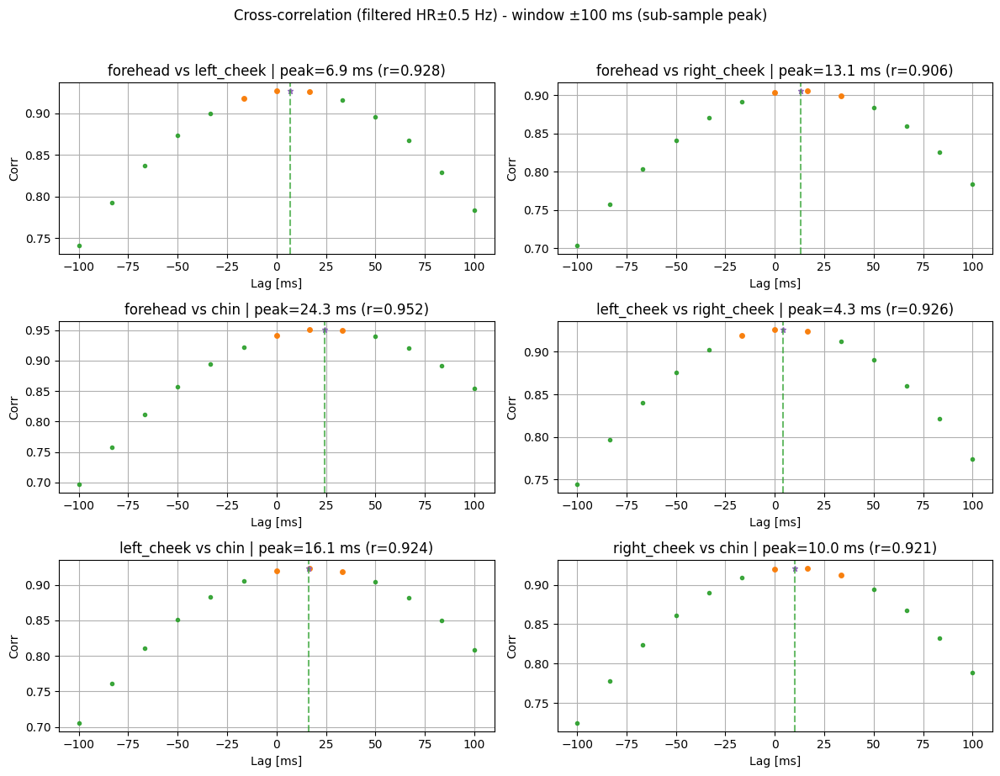

In [5]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_pedro_video_lossless_20251210_030306,
    fs=60,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

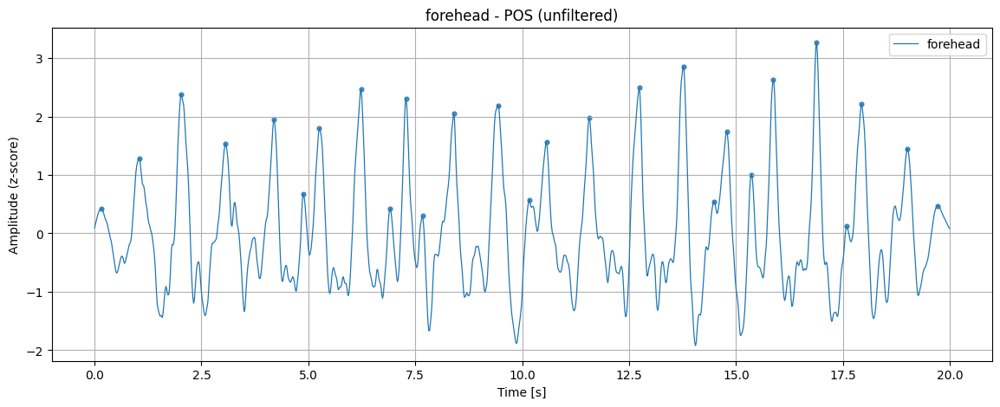

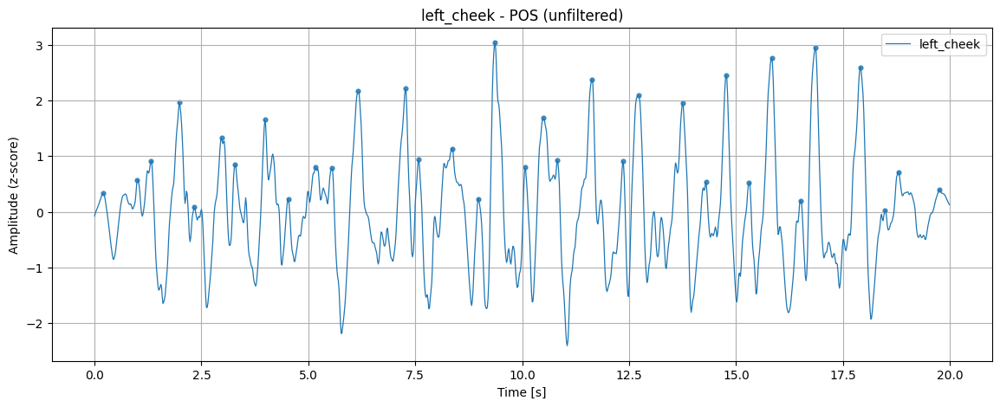

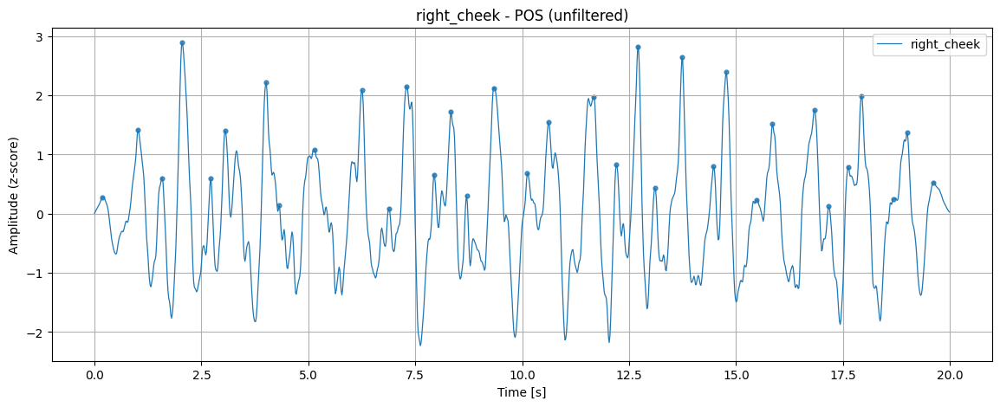

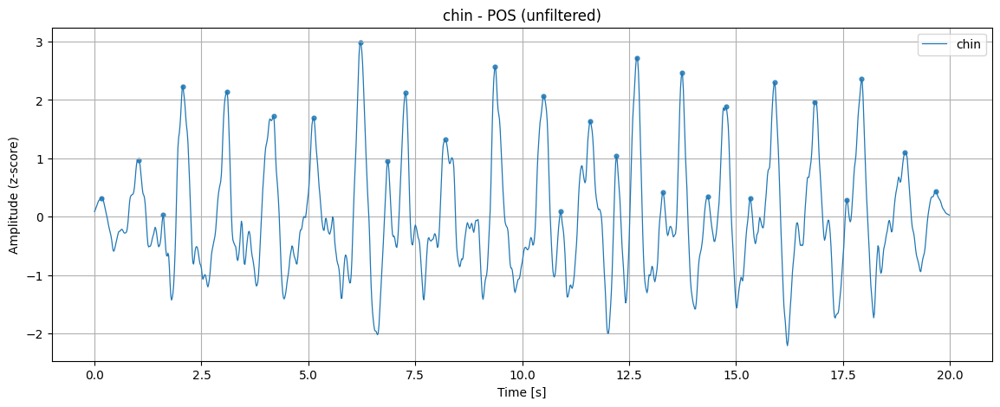

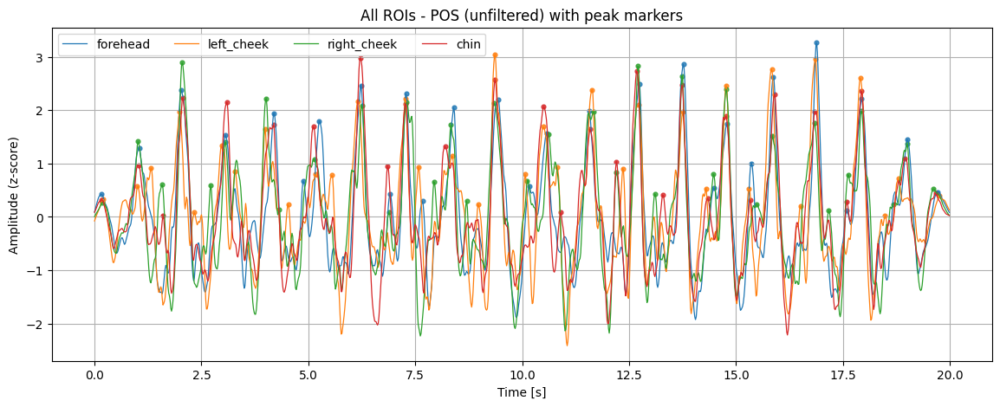

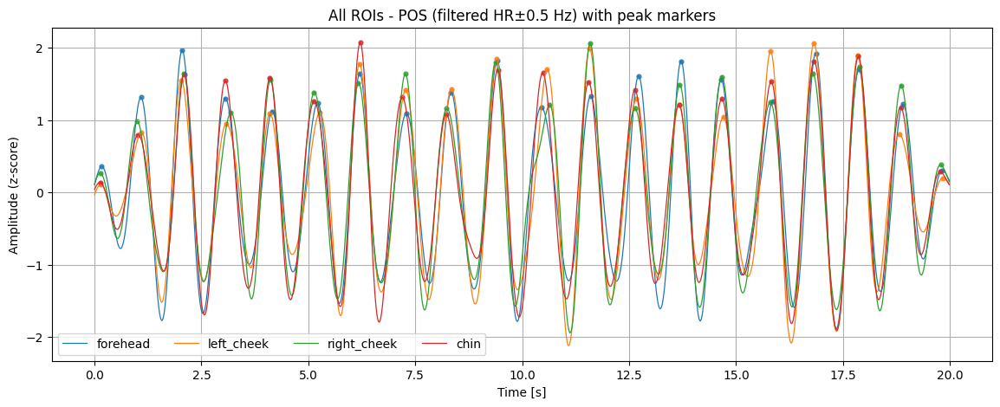

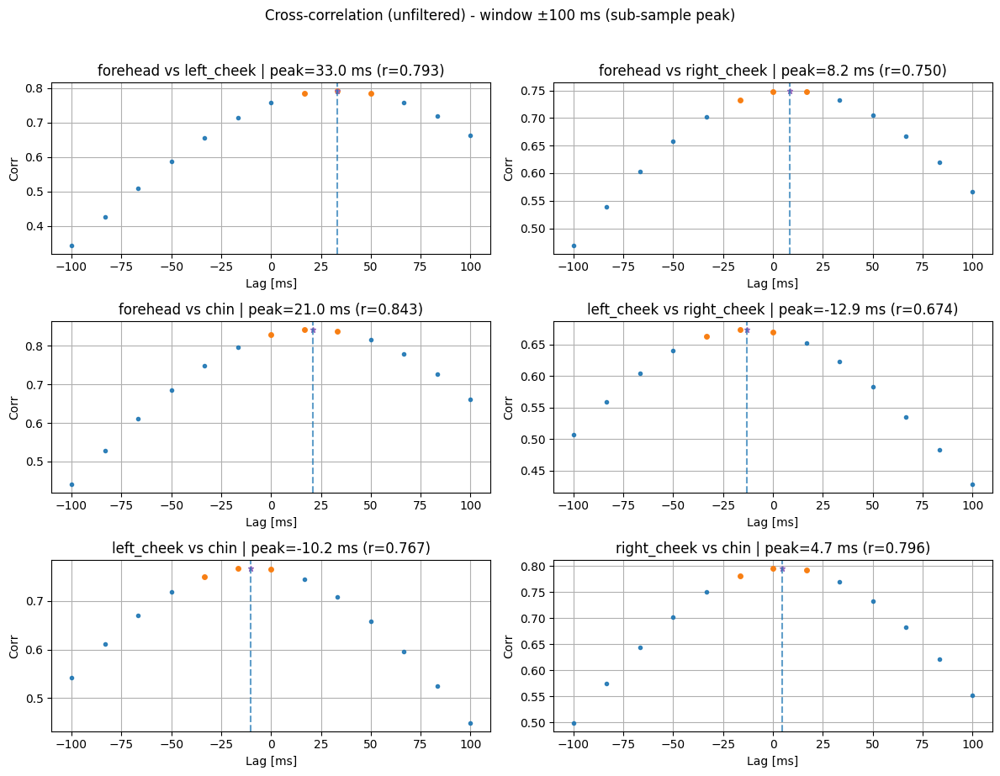

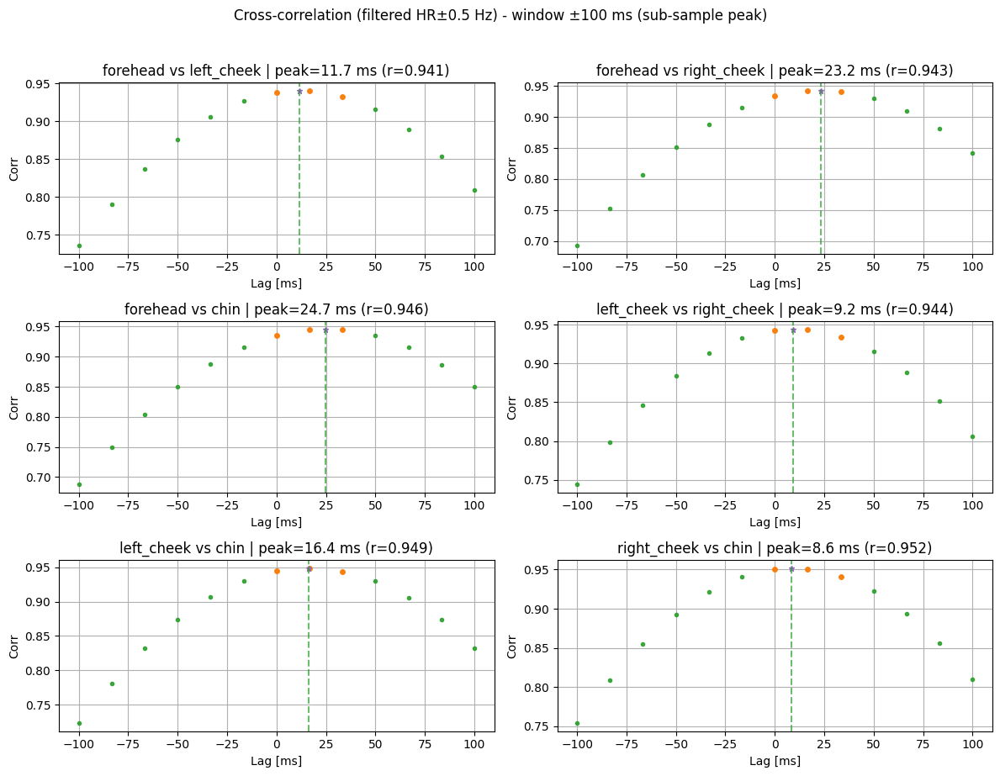

In [6]:

rois_sliced = {}
for roi in rois_pedro_video_lossless_20251210_030306:
    rois_sliced[roi] ={}
    for color in rois_pedro_video_lossless_20251210_030306[roi]:
        rois_sliced[roi][color] = rois_pedro_video_lossless_20251210_030306[roi][color][0:60*20]
pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_sliced,
    fs=60,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

## mi video a 30 fps 

### Con MJPEG

In [8]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_30fps_mjpeg = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "pedro_video_30fps_mjpeg.mkv", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=False
)

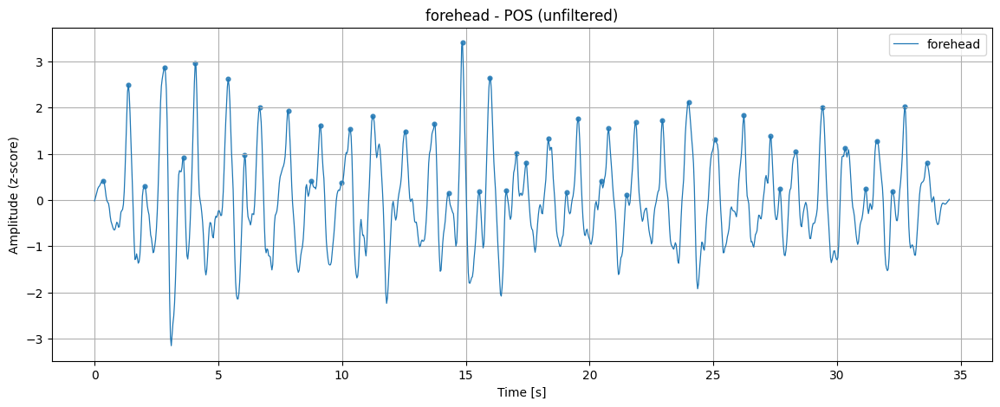

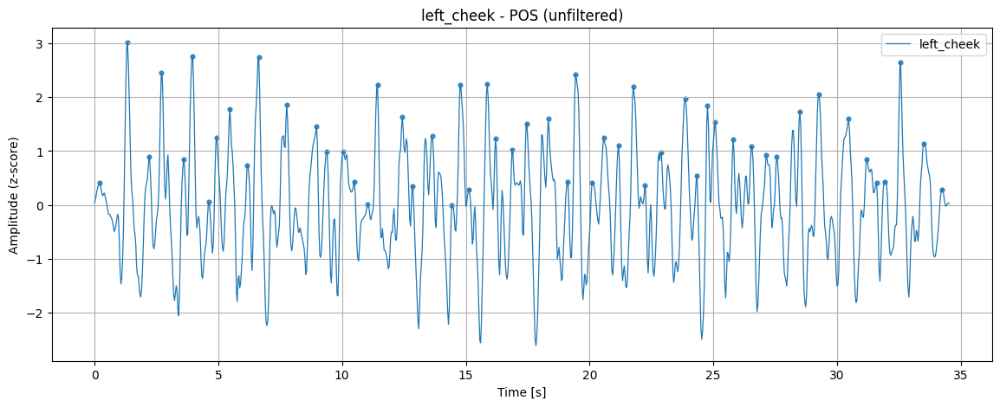

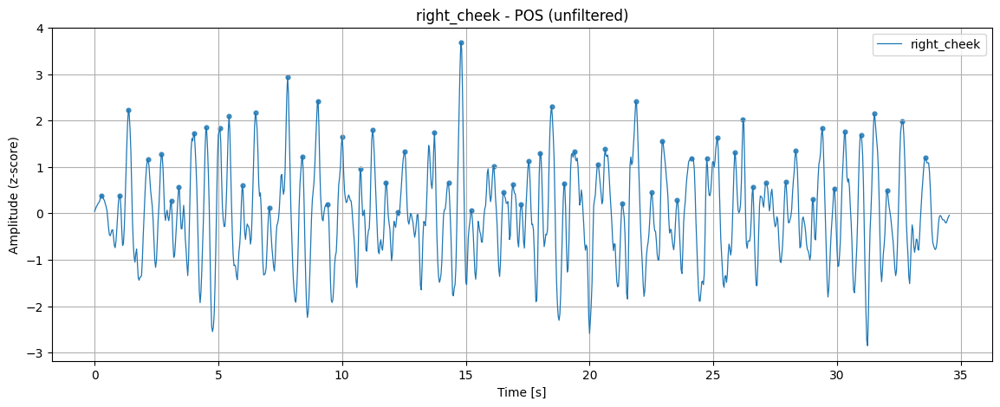

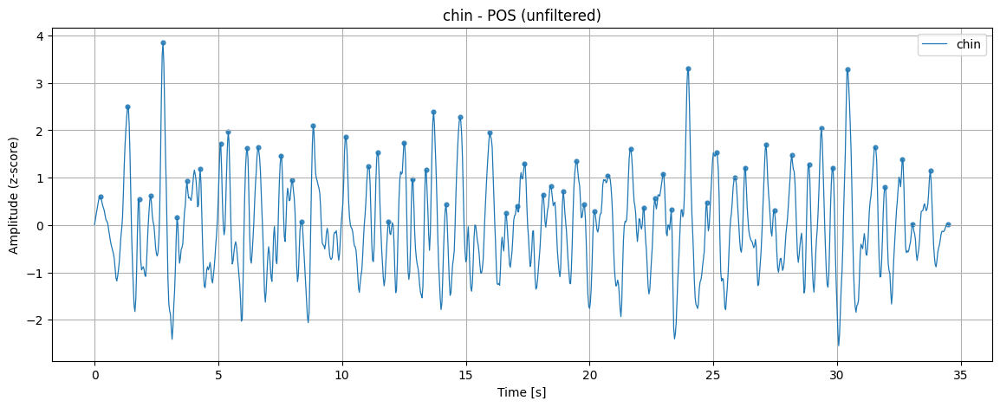

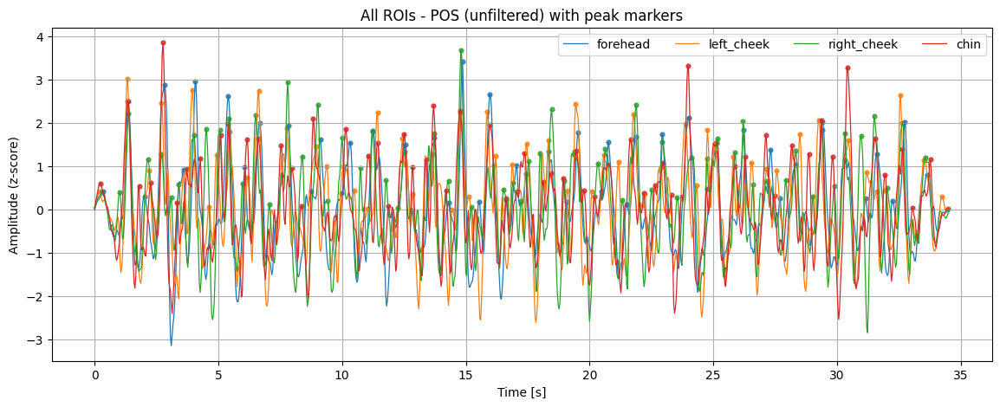

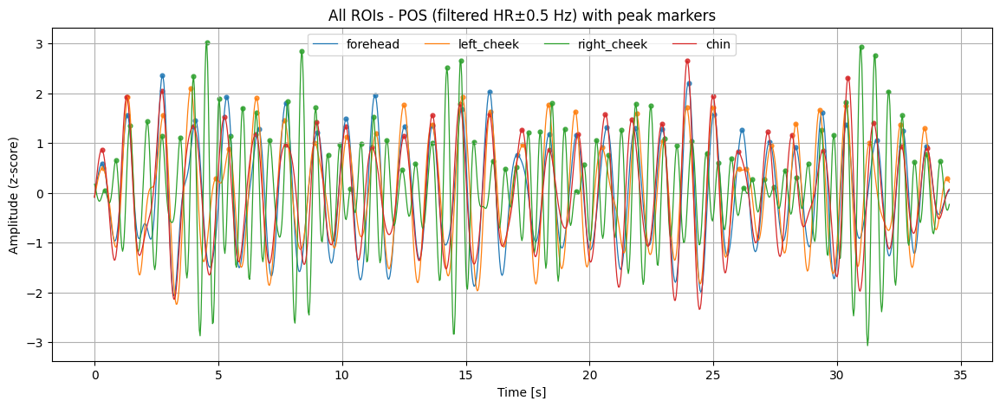

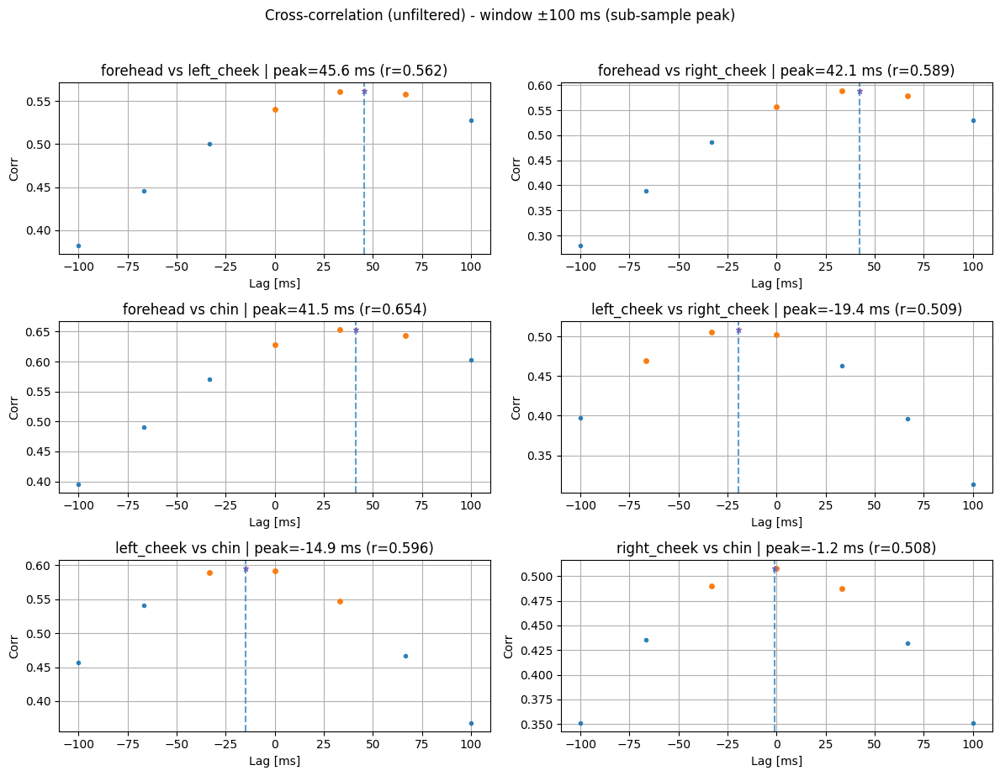

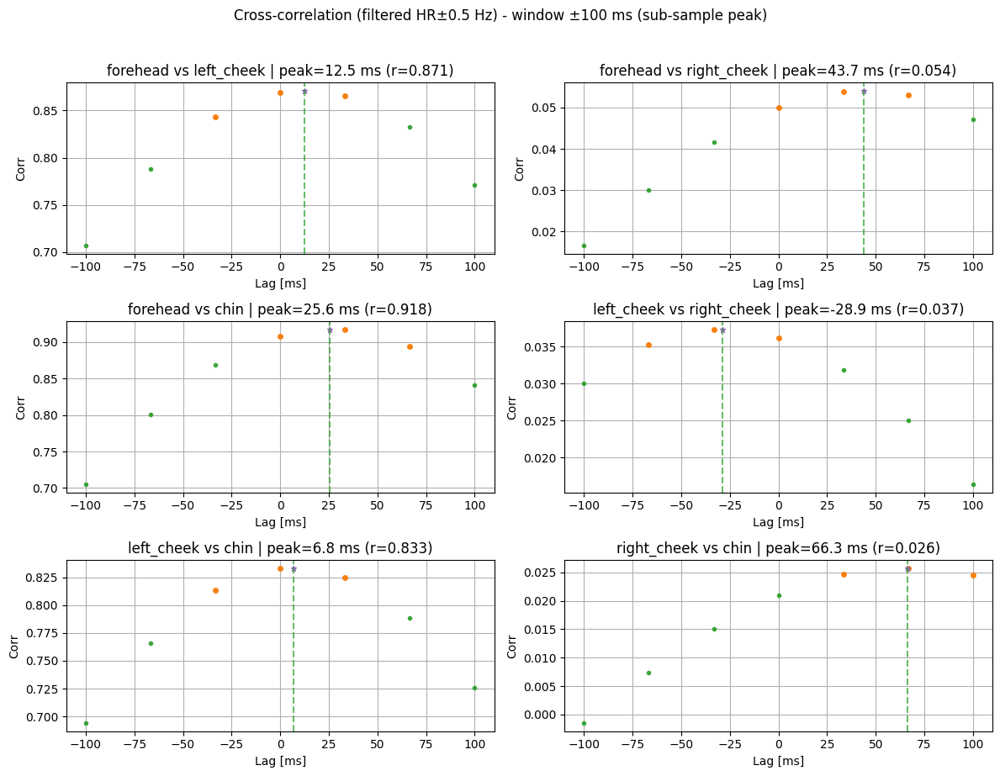

In [13]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_pedro_video_30fps_mjpeg,
    fs=30,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

### Lossless

In [ ]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_30fps_lossless = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "pedro_video_30fps_lossless.mkv", 30,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=F
)

FileNotFoundError: Video file not found: pedro_video_30fps_lossless.mkv

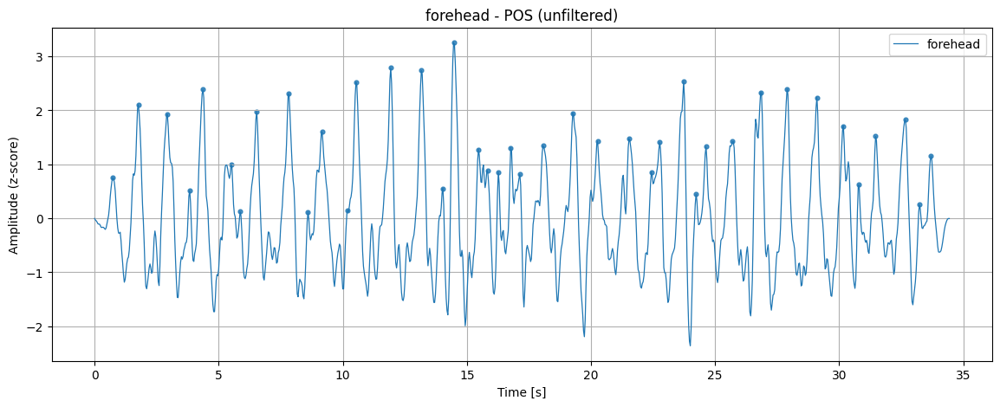

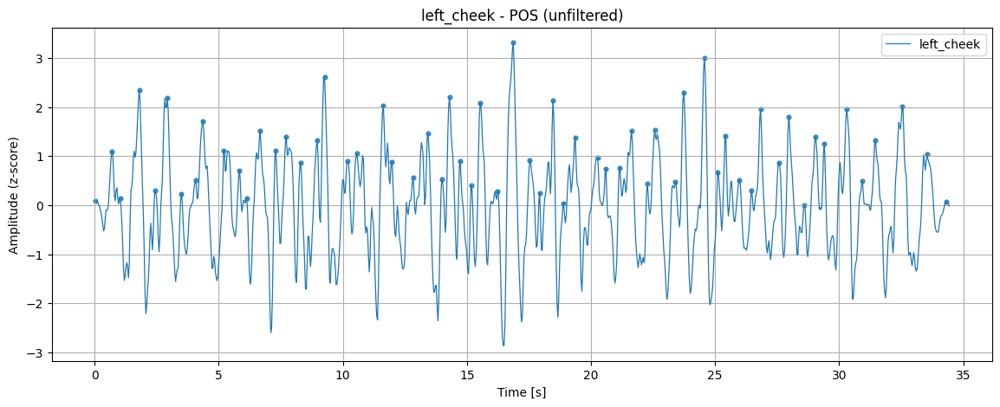

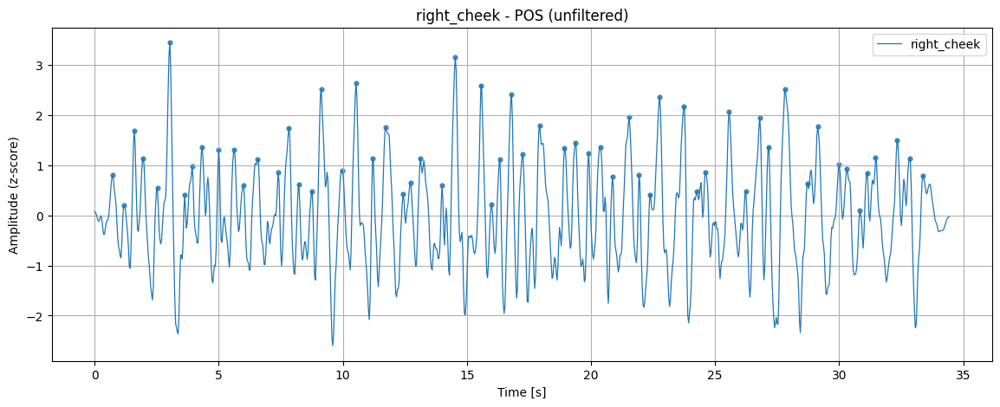

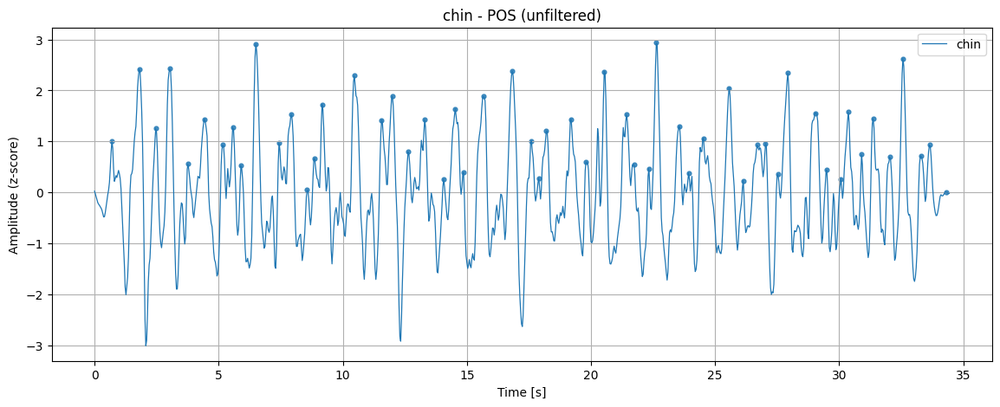

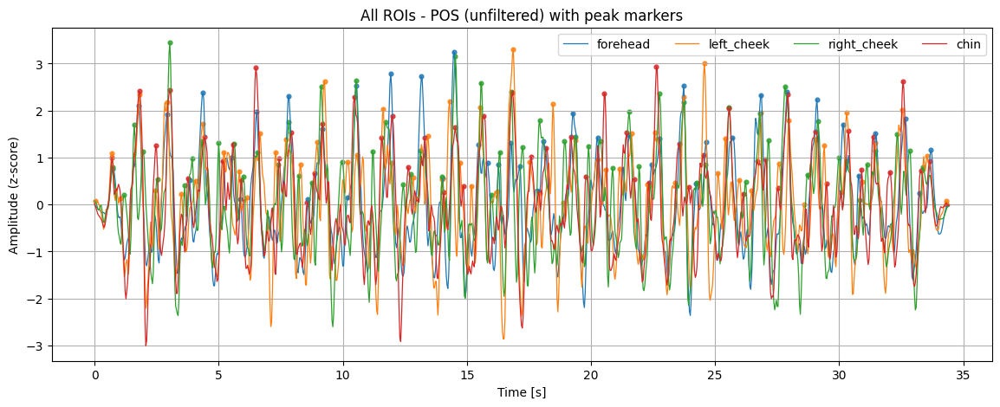

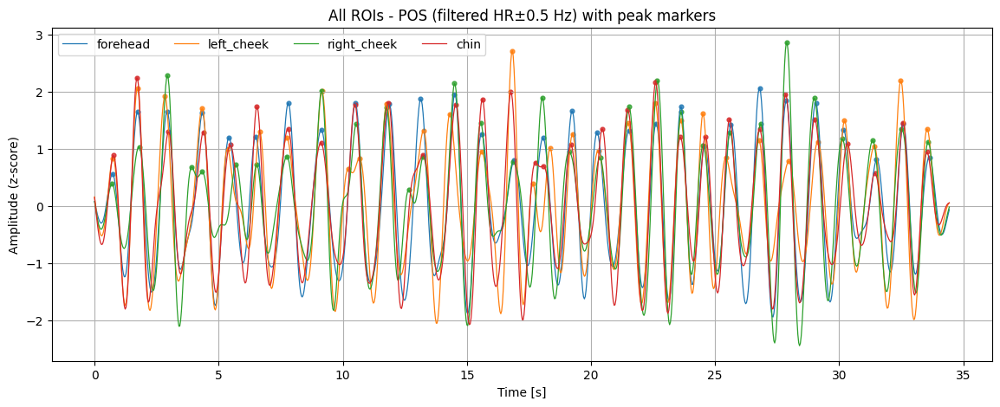

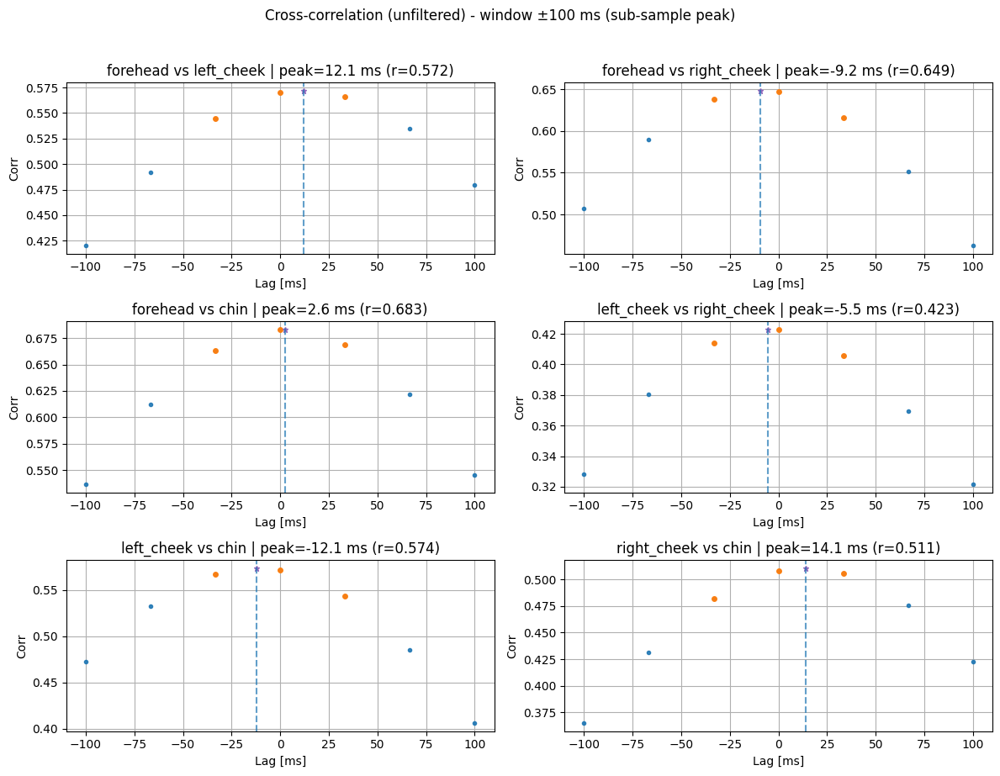

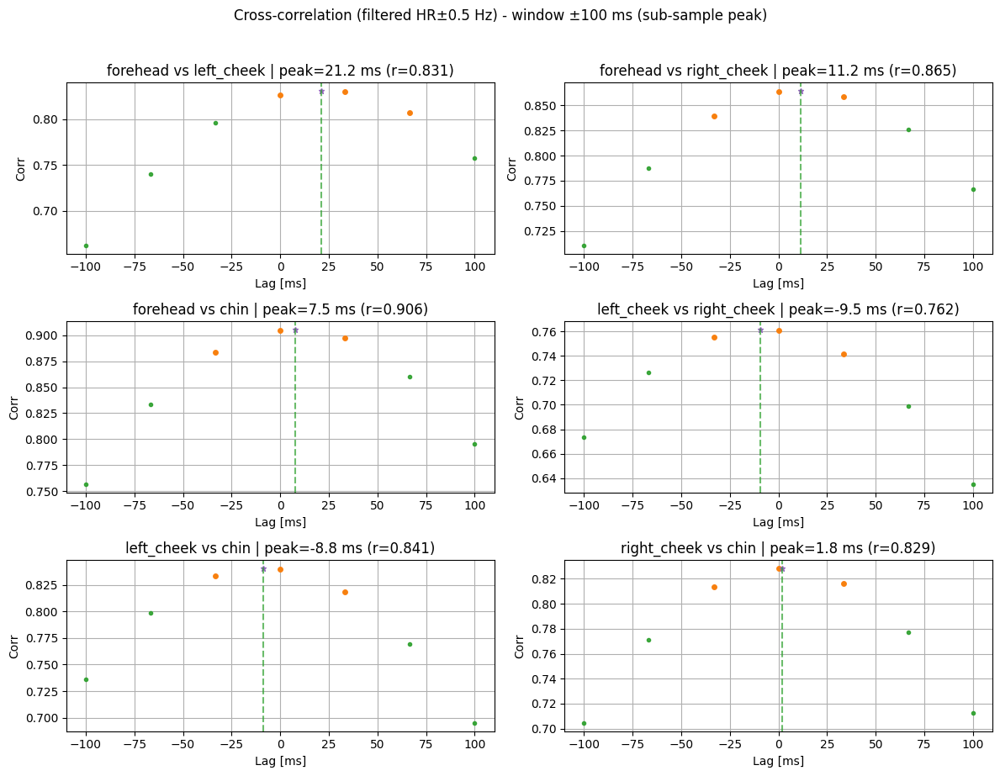

In [14]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_pedro_video_30fps_lossless,
    fs=30,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

## LABO OPTO 10/12

In [12]:
from IppgSignalObtainer import IppgSignalObtainer

rois_pedro_video_prueba = IppgSignalObtainer.extractSeriesRoiRGBFromVideo(
    "video_lossless_20251210_195418_67bpm_veronica_piatti.mkv", 60,
    window_length=60, start_time=5,
    forehead=True, cheeks=True, under_nose=False, chin=True, full_face=False,
    play_video=False
)

I0000 00:00:1765412098.414515 21133313 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765412098.428909 21243138 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765412098.437565 21243138 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


In [13]:
rois_sliced_pedro_prueba = {}
for roi in rois_pedro_video_prueba:
    rois_sliced_pedro_prueba[roi] ={}
    for color in rois_pedro_video_prueba[roi]:
        rois_sliced_pedro_prueba[roi][color] = rois_pedro_video_prueba[roi][color][0:60*20]

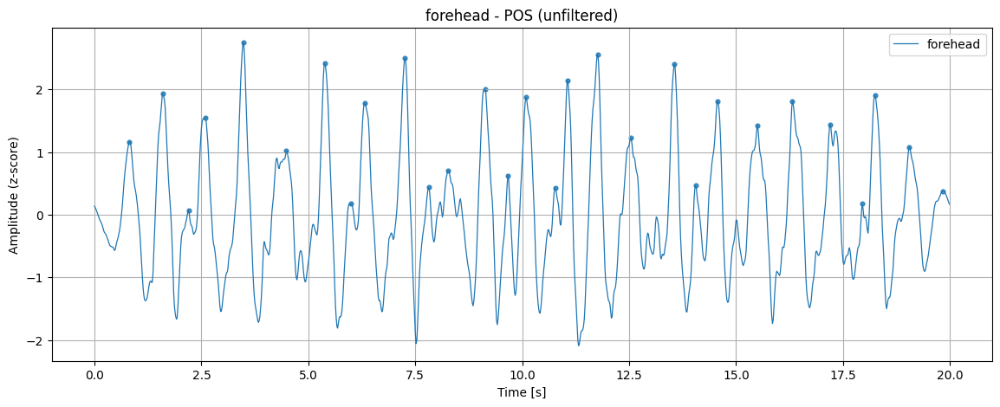

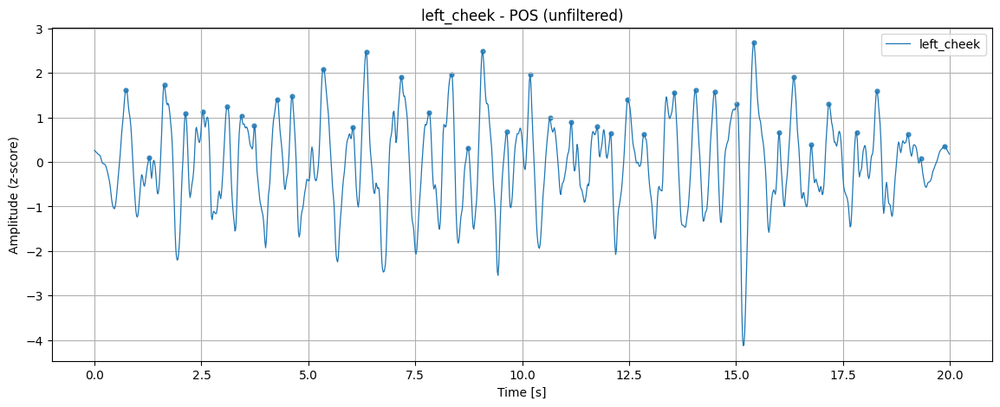

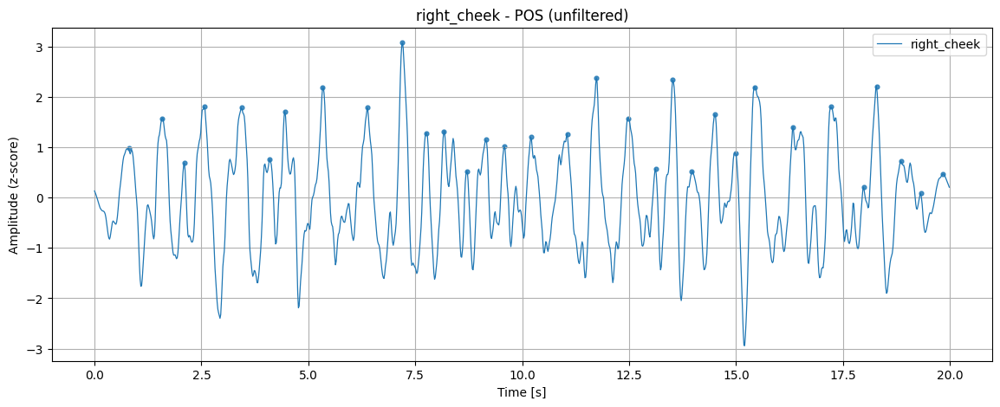

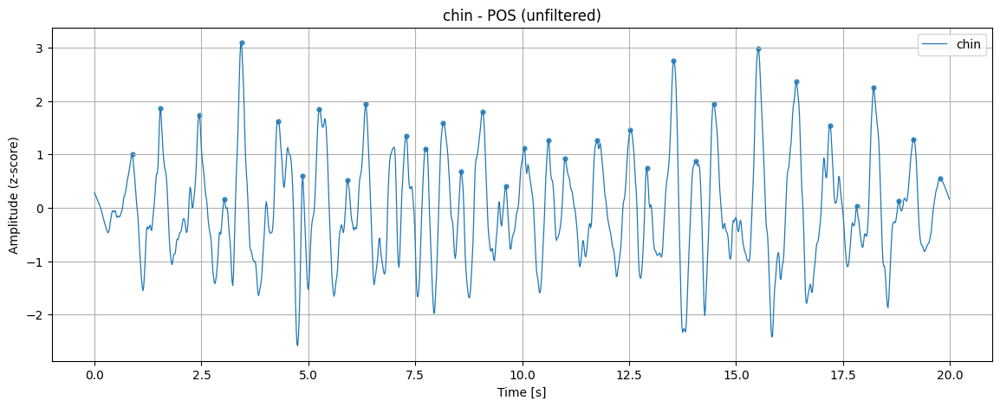

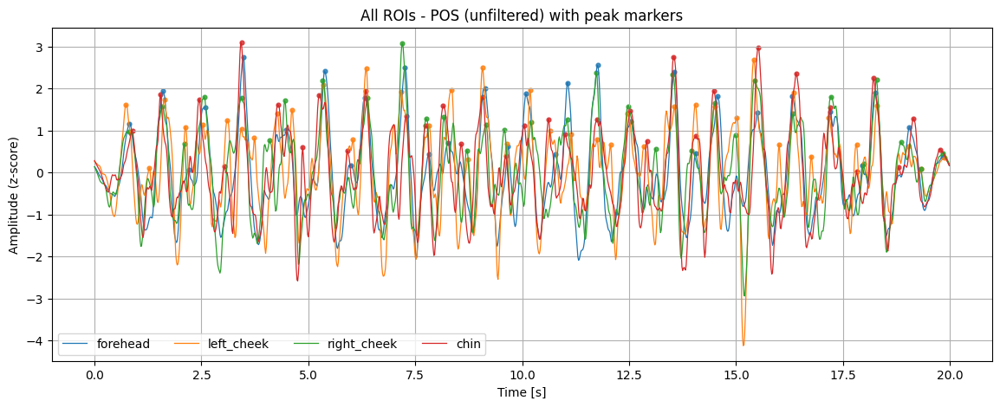

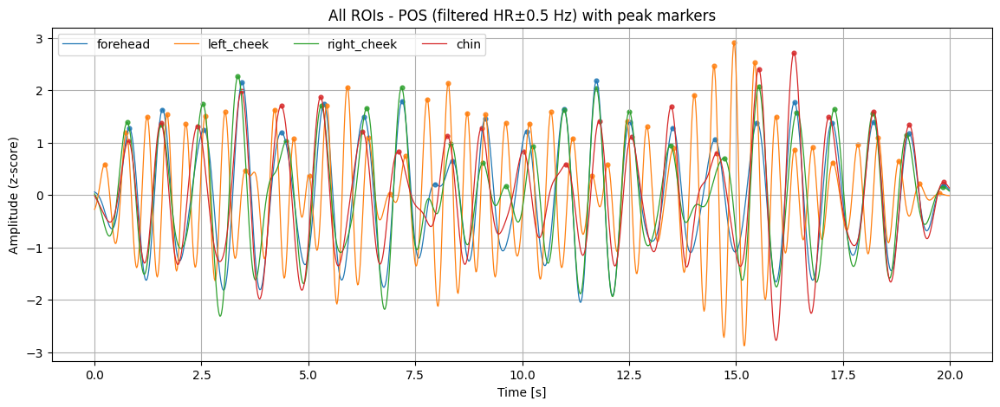

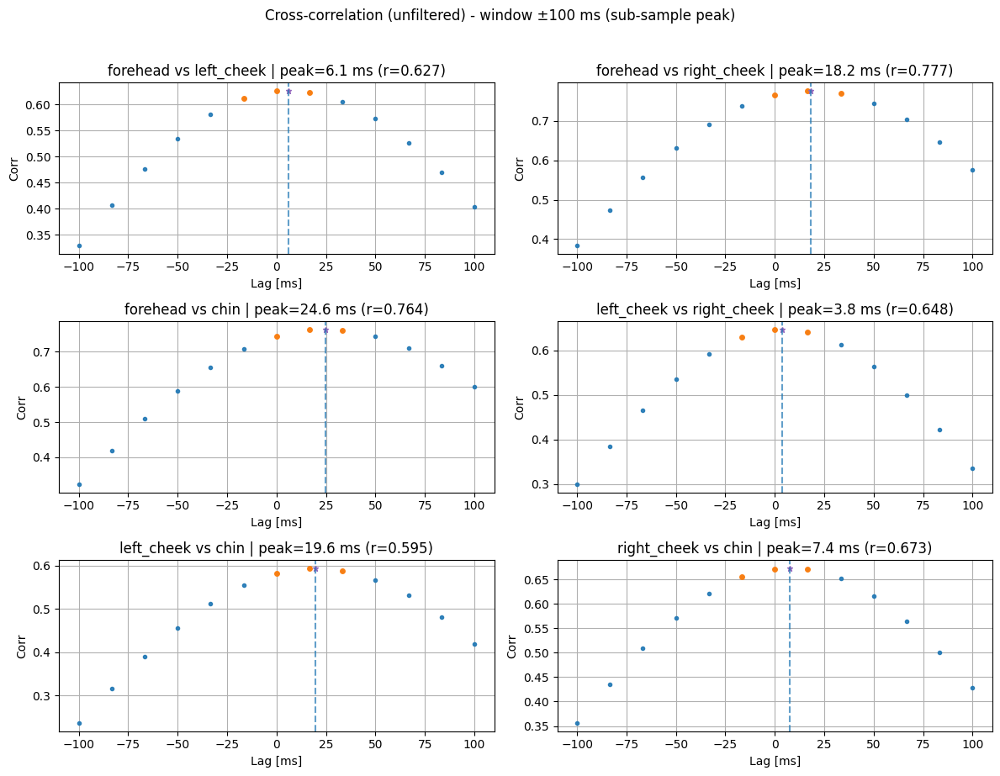

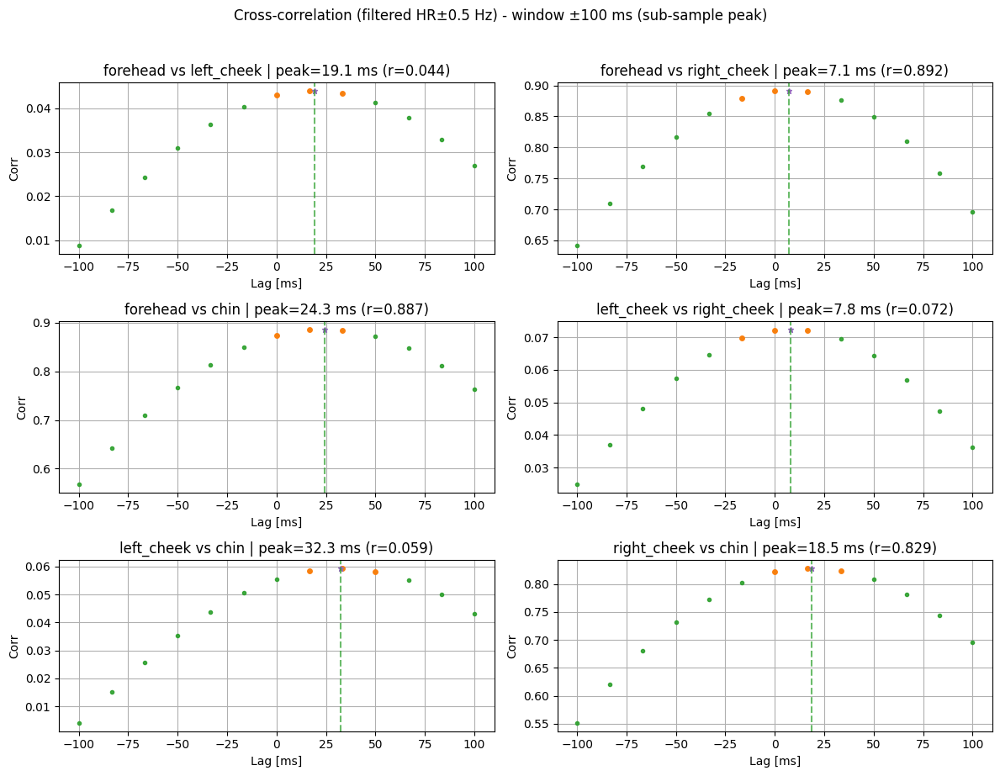

In [14]:

pos_signals_all, pos_signals_narrow_all = plot_rois_xcorr_from_precomputed_rois(
    rois_rgb=rois_sliced_pedro_prueba,
    fs=60,
    show_filtered=True,
    normalize=True,
    plot_individual = True
)

## Lossless Videos Analysis (60 fps, HR from filename, correlation filter)

Analyze all lossless videos in the root directory with HR extracted from filenames.
Only keeps results with correlation >= 0.5.


In [2]:
# Lossless videos analysis (60 fps, HR from filename, correlation filter)
results_df, summary_df, failures_df = analyze_lossless_videos_lag_metrics(
    video_folder='.',
    video_pattern='video_lossless_*.mkv',
    fs=60,
    window_length=60,
    start_time=5,
    n_beats=10,
    step_beats=1,
    min_correlation=0.5,
    prealign=True,
    save_csv_path='lossless_lag_metrics.csv',
    forehead=True, cheeks=True, under_nose=False, chin=True
)

print('Results (per video / pair / mode):')
display(results_df.head(20))

print('Summary (aggregated per pair / mode):')
display(summary_df)

print('Failures:')
display(failures_df.head(20))


Found 11 videos to analyze
Processing video_lossless_20251210_193001_67bpm_jeronimo_lopez_vila.mkv (GT HR: 67.0 bpm)


I0000 00:00:1765856291.797688 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1765856291.801642 7867928 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856291.819564 7867927 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856291.835746 7867925 landmark_projection_calculator.cc:186] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.
[matroska,webm @ 0x12e264b40] File ended prematurely


Processing video_lossless_20251210_193429_54bpm_lucia_olivetto.mkv (GT HR: 54.0 bpm)


I0000 00:00:1765856324.297777 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856324.308705 7868995 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856324.325570 7868998 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
[matroska,webm @ 0x17e66b990] File ended prematurely


Processing video_lossless_20251210_194040_66bpm_tomas_pietravallo.mkv (GT HR: 66.0 bpm)


I0000 00:00:1765856354.931343 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856354.933941 7869318 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856354.941898 7869321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing video_lossless_20251210_194839_63bpm_facundo_criscuolo.mkv (GT HR: 63.0 bpm)


I0000 00:00:1765856385.470021 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856385.472173 7869606 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856385.479768 7869605 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing video_lossless_20251210_195418_67bpm_veronica_piatti.mkv (GT HR: 67.0 bpm)


I0000 00:00:1765856417.014124 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856417.018269 7870004 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856417.040735 7870011 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing video_lossless_20251210_195618_66bpm_97ox_veronica_piatti_lentes.mkv (GT HR: 66.0 bpm)


I0000 00:00:1765856451.507354 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856451.510567 7870759 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856451.517977 7870757 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing video_lossless_20251210_200024_65bpm_96ox_felipe_frezza.mkv (GT HR: 65.0 bpm)


I0000 00:00:1765856481.547327 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856481.550898 7872113 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856481.557281 7872112 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
[matroska,webm @ 0x17e6bbe40] File ended prematurely


Processing video_lossless_20251210_200547_87bpm_98ox_franco_mazza.mkv (GT HR: 87.0 bpm)


I0000 00:00:1765856509.271881 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856509.279405 7872626 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856509.289164 7872630 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing video_lossless_20251210_203908_pedro_60-72bpm.mkv (GT HR: 66.0 bpm)


I0000 00:00:1765856540.237977 7282201 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M3
W0000 00:00:1765856540.245333 7873369 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1765856540.270826 7873367 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Results (per video / pair / mode):


,video_id,roi_a,roi_b,mode,gt_hr_bpm,hr_a,hr_b,err_a,err_b,global_lag_ms_precalc,...,n_windows,median_residual_lag_ms,iqr_residual_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,rms_residual_lag_ms,median_r,pct_windows_|lag|<=1frame,pct_windows_r>=0.8
5,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,chin,filtered,67.0,70.3125,70.3125,3.3125,3.3125,18.716388,...,54,1.203564,74.006104,37.048479,46.291207,22.288957,56.267365,0.769015,18.518519,42.592593
4,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,chin,unfiltered,67.0,70.3125,70.3125,3.3125,3.3125,13.237862,...,81,-2.120451,44.339107,21.814318,22.133779,4.207138,27.599833,0.597095,45.679012,0.000000
1,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,left_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,26.996057,...,54,-3.277923,26.230585,13.231303,14.925782,3.556704,18.012645,0.820788,62.962963,61.111111
0,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,left_cheek,unfiltered,67.0,70.3125,70.3125,3.3125,3.3125,14.625581,...,81,0.339100,14.086426,7.192074,10.559675,2.462274,14.835005,0.691346,79.012346,7.407407
3,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,right_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,6.197219,...,54,-2.434633,53.906685,25.162490,31.698486,7.197217,40.974360,0.761995,29.629630,27.777778
2,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,right_cheek,unfiltered,67.0,70.3125,70.3125,3.3125,3.3125,-10.862269,...,81,-0.028310,22.871153,10.484700,15.658416,3.403224,22.847429,0.603504,66.666667,0.000000
9,video_lossless_20251210_193001_67bpm_jeronimo_...,left_cheek,chin,filtered,67.0,70.3125,70.3125,3.3125,3.3125,5.705495,...,57,-1.974162,46.526743,27.443981,24.532339,5.144687,29.634407,0.771868,35.087719,31.578947
8,video_lossless_20251210_193001_67bpm_jeronimo_...,left_cheek,chin,unfiltered,67.0,70.3125,70.3125,3.3125,3.3125,3.074669,...,93,-1.254116,32.463103,15.531646,17.690338,4.080205,21.671046,0.562907,52.688172,0.000000
7,video_lossless_20251210_193001_67bpm_jeronimo_...,left_cheek,right_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,-0.206922,...,57,1.339774,14.310944,7.325075,15.063919,3.076361,24.185871,0.804966,75.438596,52.631579
6,video_lossless_20251210_193001_67bpm_jeronimo_...,left_cheek,right_cheek,unfiltered,67.0,70.3125,70.3125,3.3125,3.3125,-10.650850,...,93,0.647434,21.494638,8.761018,12.939104,2.555033,16.756219,0.637886,64.516129,1.075269


Summary (aggregated per pair / mode):


,roi_a,roi_b,mode,videos,n_windows,median_global_lag_ms,median_global_r,median_residual_lag_ms,median_iqr_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,median_rms_residual_lag_ms,mean_pct_within_1frame,mean_pct_high_r
0,forehead,chin,filtered,8,506,17.460131,0.758010,0.146482,39.624655,21.482958,26.085703,7.778601,27.480548,43.729431,59.264264
1,forehead,chin,unfiltered,8,665,10.640409,0.643342,-0.713694,20.394652,8.002940,16.097182,4.130022,17.956026,64.548908,12.061676
2,forehead,left_cheek,filtered,7,454,21.668746,0.794514,-0.776912,28.953539,15.190709,19.998047,3.891572,20.321604,52.891011,54.663798
3,forehead,left_cheek,unfiltered,8,665,9.348707,0.638746,0.156679,19.607796,9.442625,14.681151,3.403290,19.774380,68.742583,3.399884
4,forehead,right_cheek,filtered,9,558,19.299064,0.765867,-1.015959,23.820083,10.744819,18.947827,5.273668,20.776470,61.882027,45.122265
5,forehead,right_cheek,unfiltered,9,753,6.563717,0.575268,-0.170418,18.860195,9.483393,18.215460,4.051638,23.231402,65.470593,2.068830
6,left_cheek,chin,filtered,7,491,-5.109284,0.755780,-0.228994,28.313990,14.785637,22.988459,5.144687,25.097485,47.893607,42.187953
7,left_cheek,chin,unfiltered,6,602,-0.860912,0.548661,-0.225662,32.843279,16.670009,20.712441,4.063141,29.452480,49.885387,0.000000
8,left_cheek,right_cheek,filtered,7,491,3.119538,0.797199,0.792944,26.603976,13.540240,19.782693,4.594888,24.185871,59.501332,46.819081
9,left_cheek,right_cheek,unfiltered,6,610,3.533339,0.619606,0.526850,23.898926,10.293976,16.439576,3.495692,22.034065,63.458904,5.304092


Failures:


,video_id,reason
0,video_lossless_20251210_191238,Could not parse HR from filename: video_lossle...
1,video_lossless_20251210_192128,Could not parse HR from filename: video_lossle...


## Lossless Videos Analysis - DISCRETE (no interpolation)

Same analysis but using discrete sample lags (no interpolation). 
Lags are integer multiples of the sample period (0, ±1 sample, ±2 samples, etc.).


In [2]:
from roi_analysis import analyze_lossless_videos_lag_metrics_with_hr_filter

results_df, summary_df, failures_df = analyze_lossless_videos_lag_metrics_with_hr_filter(
    video_folder=r"C:\Users\pedro\edge-rppg-health\VIDEOS 60 FPS",
    video_pattern="video_lossless_*.mkv",
    fs=60,
    window_length=60,
    start_time=5,
    n_beats=10,
    step_beats=1,
    hr_err_threshold_bpm=10.0,
    min_correlation=0.7,
    use_interpolation=True,  # <-- no interpolation (discrete)
    prealign=True,
    save_csv_path="videos60_lag_metrics_hrfilter_interpolated.csv",
    forehead=True, cheeks=True, under_nose=False, chin=True,
)

Found 16 videos to analyze (INTERP mode)


In [6]:
print('Results (per video / pair / mode) - DISCRETE:')
display(results_df.head(20))

print('Summary (aggregated per pair / mode) - DISCRETE:')
display(summary_df)

print('Failures - DISCRETE:')
display(failures_df.head(20))


Results (per video / pair / mode) - DISCRETE:


,video_id,roi_a,roi_b,mode,gt_hr_bpm,hr_a,hr_b,err_a,err_b,global_lag_ms_precalc,...,iqr_residual_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,rms_residual_lag_ms,median_r,pct_windows_|lag|<=1frame,pct_windows_|lag|>1frame,pct_windows_|lag|>2frames,pct_windows_r>=0.8
2,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,chin,filtered,67.0,70.3125,70.3125,3.3125,3.3125,18.538285,...,71.824147,36.681442,46.703881,22.599110,56.928060,0.767268,18.518519,81.481481,55.555556,42.592593
0,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,left_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,27.148401,...,25.109094,12.823133,14.809885,3.125537,17.909305,0.821547,61.111111,38.888889,5.555556,62.962963
1,video_lossless_20251210_193001_67bpm_jeronimo_...,forehead,right_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,5.253118,...,54.805300,25.005649,31.460631,6.821374,40.179207,0.764491,29.629630,70.370370,33.333333,29.629630
4,video_lossless_20251210_193001_67bpm_jeronimo_...,left_cheek,chin,filtered,67.0,70.3125,70.3125,3.3125,3.3125,5.943077,...,44.797643,25.035910,24.050323,5.914991,29.101342,0.770846,35.087719,64.912281,28.070175,29.824561
3,video_lossless_20251210_193001_67bpm_jeronimo_...,left_cheek,right_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,-1.226512,...,14.771805,7.372719,14.938104,3.220667,24.233647,0.804369,75.438596,24.561404,15.789474,56.140351
5,video_lossless_20251210_193001_67bpm_jeronimo_...,right_cheek,chin,filtered,67.0,70.3125,70.3125,3.3125,3.3125,21.101120,...,24.088061,13.516892,17.935394,4.868334,23.423668,0.786707,55.000000,45.000000,18.333333,33.333333
6,video_lossless_20251210_194040_66bpm_tomas_pie...,forehead,right_cheek,filtered,66.0,56.2500,70.3125,9.7500,4.3125,28.951981,...,30.739170,13.174503,22.307569,6.545737,32.058366,0.797650,53.846154,46.153846,21.153846,50.000000
11,video_lossless_20251210_195418_67bpm_veronica_...,forehead,chin,filtered,67.0,70.3125,70.3125,3.3125,3.3125,31.243134,...,14.497519,8.104048,10.740850,2.264514,13.640977,0.944687,71.929825,28.070175,0.000000,100.000000
10,video_lossless_20251210_195418_67bpm_veronica_...,forehead,chin,unfiltered,67.0,70.3125,70.3125,3.3125,3.3125,21.418354,...,13.511080,6.508622,7.416691,1.631993,9.302532,0.809284,90.277778,9.722222,0.000000,59.722222
7,video_lossless_20251210_195418_67bpm_veronica_...,forehead,left_cheek,filtered,67.0,70.3125,70.3125,3.3125,3.3125,3.131539,...,24.758049,12.598351,14.128991,2.639066,17.360262,0.873733,61.403509,38.596491,3.508772,80.701754


Summary (aggregated per pair / mode) - DISCRETE:


,roi_a,roi_b,mode,videos,n_windows,median_global_lag_ms,median_global_r,median_residual_lag_ms,median_iqr_lag_ms,median_abs_residual_lag_ms,mean_abs_residual_lag_ms,mode_abs_residual_lag_ms,median_rms_residual_lag_ms,mean_pct_within_1frame,mean_pct_over_1frame,mean_pct_over_2frames,mean_pct_high_r
0,forehead,chin,filtered,7,427,16.205330,0.871026,0.661259,25.178518,13.178987,20.802109,4.032988,22.465269,52.071614,47.928386,19.820255,79.358236
1,forehead,chin,unfiltered,3,212,9.545314,0.755398,0.228125,13.511080,6.670295,9.147920,2.309664,12.730590,83.450421,16.549579,0.483092,35.550056
2,forehead,left_cheek,filtered,7,417,21.111610,0.801560,-0.773843,25.109094,12.823133,16.029356,4.028299,17.909305,59.417730,40.582270,9.258691,67.468731
3,forehead,left_cheek,unfiltered,1,69,-1.062409,0.745391,1.733477,9.449641,4.716731,12.031938,2.464693,19.890397,76.811594,23.188406,13.043478,28.985507
4,forehead,right_cheek,filtered,8,469,20.589883,0.786025,1.250396,21.705826,10.774068,16.147309,4.928408,18.486662,65.198702,34.801298,11.220036,60.706824
5,forehead,right_cheek,unfiltered,2,141,10.079288,0.729176,-0.493177,14.510396,7.373479,9.476421,3.450726,11.959024,82.276570,17.723430,0.000000,13.586957
6,left_cheek,chin,filtered,6,375,7.495520,0.795116,-1.498276,20.099184,10.505646,15.724023,4.028712,20.867894,64.993810,35.006190,14.055783,57.471515
7,left_cheek,right_cheek,filtered,7,440,2.685940,0.803430,0.668314,17.591185,8.502832,16.118226,4.234929,22.889671,65.842466,34.157534,14.039820,56.696052
8,right_cheek,chin,filtered,6,380,1.691025,0.778619,2.716042,27.834213,14.822625,17.748765,4.130364,22.662463,55.088760,44.911240,14.271511,50.064753


Failures - DISCRETE:


,video_id,reason,gt_hr_bpm,hr_chin,err_chin,hr_forehead,err_forehead,hr_left_cheek,err_left_cheek,hr_right_cheek,err_right_cheek
0,video_lossless_20251210_191238,Could not parse HR from filename: video_lossle...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,video_lossless_20251210_192128,Could not parse HR from filename: video_lossle...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,video_lossless_20251210_193429_54bpm_lucia_oli...,Less than 2 ROIs with HR error < 10.0 bpm,54.0,98.4375,44.4375,98.4375,44.4375,112.5,58.5,112.5,58.5
3,video_lossless_20251216_231611_58bpm_99ox_nico...,Less than 2 ROIs with HR error < 10.0 bpm,58.0,112.5000,54.5000,56.2500,1.7500,112.5,54.5,112.5,54.5
4,video_lossless_20251216_232421_62_97_gabruela_...,Could not parse HR from filename: video_lossle...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
from roi_analysis import summarize_ubfc_global_lag_by_frames_per_roi

overall_by_mode, per_roi_total, per_pair = summarize_ubfc_global_lag_by_frames_per_roi(
    csv_path="videos60_lag_metrics_hrfilter_interpolated.csv",
    fs=60,  # important: your videos are 60 fps
)

display(overall_by_mode)   # filtered / unfiltered / total
display(per_roi_total)     # per ROI totals (no duplicates issue)
display(per_pair)          # unique pairs only (roi_a, roi_b sorted)

c:\Users\pedro\edge-rppg-health\roi_analysis.py:1816: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  overall_by_mode = df.groupby(extra + ["mode"], dropna=False).apply(_summ).reset_index()
c:\Users\pedro\edge-rppg-health\roi_analysis.py:1827: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_roi_total = long_df.groupby(extra + ["mode", "roi"], dropna=False).apply(_summ).reset_index()
c:\Users\pedro\edge-rppg-health\ro

,mode,n_rows,pct_0step,pct_ge_1step,pct_ge_2step
0,filtered,41.0,31.707317,68.292683,17.073171
1,total,47.0,34.042553,65.957447,14.893617
2,unfiltered,6.0,50.000000,50.000000,0.000000


,mode,roi,n_rows,pct_0step,pct_ge_1step,pct_ge_2step
0,filtered,chin,19.0,21.052632,78.947368,15.789474
1,filtered,forehead,22.0,27.272727,72.727273,27.272727
2,filtered,left_cheek,20.0,45.000000,55.000000,10.000000
3,filtered,right_cheek,21.0,33.333333,66.666667,14.285714
4,total,chin,22.0,22.727273,77.272727,13.636364
5,total,forehead,28.0,32.142857,67.857143,21.428571
6,total,left_cheek,21.0,47.619048,52.380952,9.523810
7,total,right_cheek,23.0,34.782609,65.217391,13.043478
8,unfiltered,chin,3.0,33.333333,66.666667,0.000000
9,unfiltered,forehead,6.0,50.000000,50.000000,0.000000


,mode,roi_a,roi_b,n_rows,pct_0step,pct_ge_1step,pct_ge_2step
0,filtered,chin,forehead,7.0,28.571429,71.428571,28.571429
1,filtered,chin,left_cheek,6.0,33.333333,66.666667,16.666667
2,filtered,chin,right_cheek,6.0,0.000000,100.000000,0.000000
3,filtered,forehead,left_cheek,7.0,28.571429,71.428571,14.285714
4,filtered,forehead,right_cheek,8.0,25.000000,75.000000,37.500000
5,filtered,left_cheek,right_cheek,7.0,71.428571,28.571429,0.000000
6,total,chin,forehead,10.0,30.000000,70.000000,20.000000
7,total,chin,left_cheek,6.0,33.333333,66.666667,16.666667
8,total,chin,right_cheek,6.0,0.000000,100.000000,0.000000
9,total,forehead,left_cheek,8.0,37.500000,62.500000,12.500000
